In [1]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import scirpy as ir
from matplotlib import pyplot as plt, cm as mpl_cm
from cycler import cycler

sc.set_figure_params(figsize=(4, 4))
sc.settings.verbosity = 2  # verbosity: errors (0), warnings (1), info (2), hints (3)

/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
import rpy2.robjects as robjects
from rpy2.robjects.packages import importr

import anndata2ri
import rpy2.rinterface_lib.callbacks
import logging
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

anndata2ri.activate()
%load_ext rpy2.ipython


In [4]:
 %reload_ext rpy2.ipython

In [5]:
plt.rcParams["axes.grid"] = False

In [6]:
sc.logging.print_header()

scanpy==1.9.3 anndata==0.8.0 umap==0.5.3 numpy==1.23.5 scipy==1.10.1 pandas==1.5.3 scikit-learn==1.0 statsmodels==0.13.5 python-igraph==0.10.4 louvain==0.8.0 pynndescent==0.5.8


In [7]:
import os
os.chdir("/home/maolp/data5/Gaofeng_All_matrix/Allcount/")

In [8]:
adata=sc.read_h5ad("./All_scanpyData/Data/Scanpy_lastCell_BCRall.h5ad")

In [9]:
adata=adata[adata.obs.Last_cell_type.str.contains("B")]
adata=adata[~adata.obs.Last_cell_type.str.contains("PP")]

In [10]:
adata.obs.Last_cell_type.value_counts()

CXCR5+ Naïve B    24602
CXCR5- Naïve B     6765
Large pre-B         113
Pro-B                13
Small pre-B           9
Name: Last_cell_type, dtype: int64

In [11]:
adata.obs.Last_cell_type.value_counts()

CXCR5+ Naïve B    24602
CXCR5- Naïve B     6765
Large pre-B         113
Pro-B                13
Small pre-B           9
Name: Last_cell_type, dtype: int64

In [12]:
import pandas as pd


categories = pd.Series(adata.obs['AdjustedID'].unique(), dtype='str')


df = categories.str.extract('(\D)(\d+\.\d+)(_.*)')


df.columns = ['letter', 'number', 'suffix']


df['number'] = df['number'].astype(float)


cat_type = pd.CategoricalDtype(categories=['B', 'L', 'T', 'S'], ordered=True)


df['letter'] = df['letter'].astype(cat_type)


df.sort_values(by=['letter', 'number'], inplace=True)

df['sorted_category'] = df.apply(lambda row: row['letter'] + str(row['number']) + row['suffix'], axis=1)


sorted_categories = df['sorted_category']


adata.obs['AdjustedID'] = pd.Categorical(adata.obs['AdjustedID'], categories=sorted_categories, ordered=True)

/tmp/ipykernel_39372/2640631437.py:30: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['AdjustedID'] = pd.Categorical(adata.obs['AdjustedID'], categories=sorted_categories, ordered=True)


In [13]:

df1 = ir.tl.spectratype(adata, target_col="AdjustedID",groupby='IR_VDJ_1_junction_aa')

df_sums1 = df1.sum(axis=0)
df_sums_ratio1 = df1.div(df_sums1, axis=1)
df_sums_ratio1  = df_sums_ratio1 .loc[~(df_sums_ratio1 ==0).all(axis=1)]
PBMC_sums_ratioIGH=df_sums_ratio1[[col for col in df_sums_ratio1 if 'B' in col] ]


In [14]:
# %%R
# # install.packages("vctrs")

In [15]:
# adata.obs['rearrangement_status_VDJ']

In [16]:
%%R
library(ggalt)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.1     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ lubridate 1.9.2     ✔ tibble    3.2.1
✔ purrr     1.0.1     ✔ tidyr     1.3.0
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors


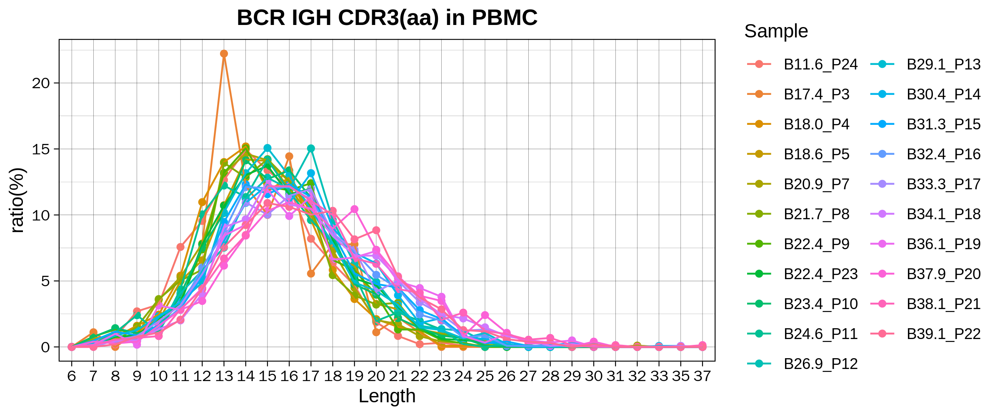

In [17]:
%%R -w 2400 -h 1000 -r 300 -i PBMC_sums_ratioIGH
library(tidyverse)
library(reshape2)
PBMC_sum_ratio=rownames_to_column(PBMC_sums_ratioIGH)
PBMC_sum_ratio <-melt(PBMC_sum_ratio,id=c("rowname"))
PBMC_sum_ratio$rowname<-factor(PBMC_sum_ratio$rowname,level=unique(PBMC_sum_ratio$rowname))


colnames(PBMC_sum_ratio)<-c('Length','Sample','ratio')
PBMC_sum_ratio$ratio<-PBMC_sum_ratio$ratio*100
ggplot(PBMC_sum_ratio)+geom_point(aes(Length,ratio,color=Sample))+
geom_line(aes(Length,ratio,color=Sample,group=Sample))+ggtitle('BCR IGH CDR3(aa) in PBMC')+theme_linedraw()+
    xlab('Length')+ylab('ratio(%)')+theme(plot.title = element_text(hjust = 0.5, size = 13, face = "bold"))

In [18]:
adata_noT12=adata[~adata.obs['AdjustedID'].isin(['T12.P25','T12.P1'])]
adata_noT12

View of AnnData object with n_obs × n_vars = 31502 × 31424
    obs: 'Name', 'doublet_scores', 'predicted_doublets', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'Cellname', 'AdjustedID', 'New_Body', 'Week', 'TCRBCRlabel', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'Last_cell_type', 'Cell_lineage', 'Last_cell_type2', 'Last_cell_type_num', 'Last_cell_type_num2', 'is_cell', 'high_confidence', 'multi_chain', 'extra_chains', 'IR_VJ_1_c_call', 'IR_VJ_2_c_call', 'IR_VDJ_1_c_call', 'IR_VDJ_2_c_call', 'IR_VJ_1_consensus_count', 'IR_VJ_2_consensus_count', 'IR_VDJ_1_consensus_count', 'IR_VDJ_2_consensus_count', 'IR_VJ_1_d_call', 'IR_VJ_2_d_call', 'IR_VDJ_1_d_call', 'IR_VDJ_2_d_call', 'IR_VJ_1_duplicate_count', 'IR_VJ_2_duplicate_count', 'IR_VDJ_1_duplicate_count', 'IR_VDJ_2_duplicate_count', 'IR_VJ_1_j_call', 'IR_VJ_2_j_call', 'IR_VDJ_1_j_call', 'IR_VDJ_2_j_call', 'IR_VJ_1_junction', 'IR_VJ_2_junction', 'IR_VDJ_1_juncti

In [19]:
adata_PBMC=adata[adata.obs.New_Body.isin(['PBMC'])]

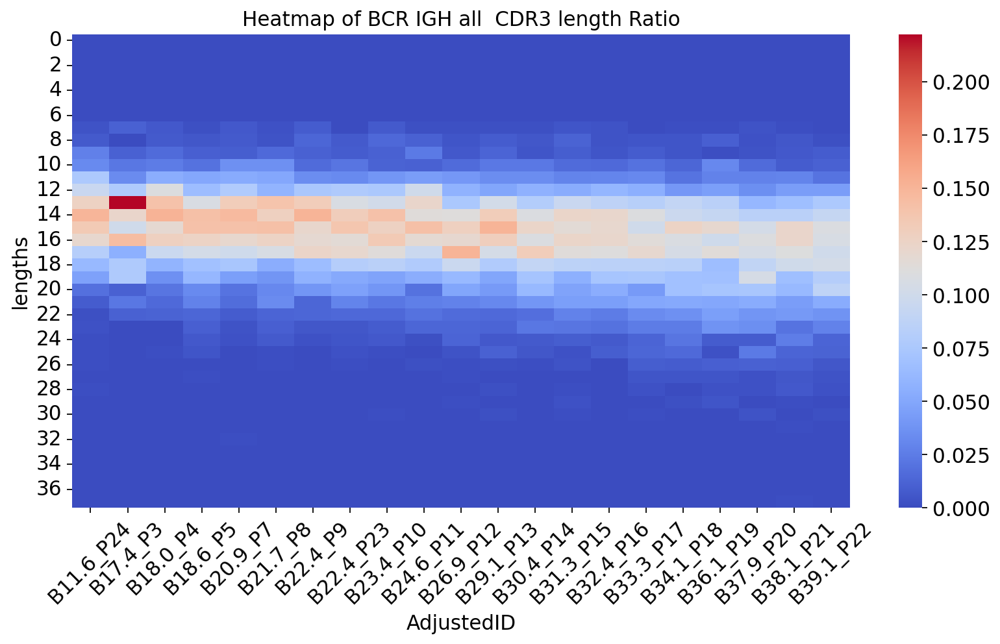

In [20]:
import anndata
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scirpy as ir
def BCR_All_plot_heatmap(adata,col='IR_VDJ_1_junction_aa',title='BCR all',groupSample="AdjustedID"):
    filtered_adata=adata
    df = ir.tl.spectratype(filtered_adata, target_col=groupSample,groupby=col)

    df_sums = df.sum(axis=0)
    df_sums_ratio = df.div(df_sums, axis=1)

    plt.figure(figsize=(12, 6))
    sns.heatmap(df_sums_ratio, xticklabels=True, cmap='coolwarm')
    plt.title(f'Heatmap of {title}  CDR3 length Ratio')
    plt.xticks(rotation=45)  
    plt.show()
    return df_sums_ratio
BCRH_ratio=BCR_All_plot_heatmap(adata_PBMC,col='IR_VDJ_1_junction_aa',title='BCR IGH all')

In [21]:
%%R
# brewer.pal(9, "Spectral")
# library(ggsci)
# mypal <- pal_futurama("planetexpress", alpha = 0.7)(9)
# mypal

# library("scales")
# show_col(mypal)

NULL


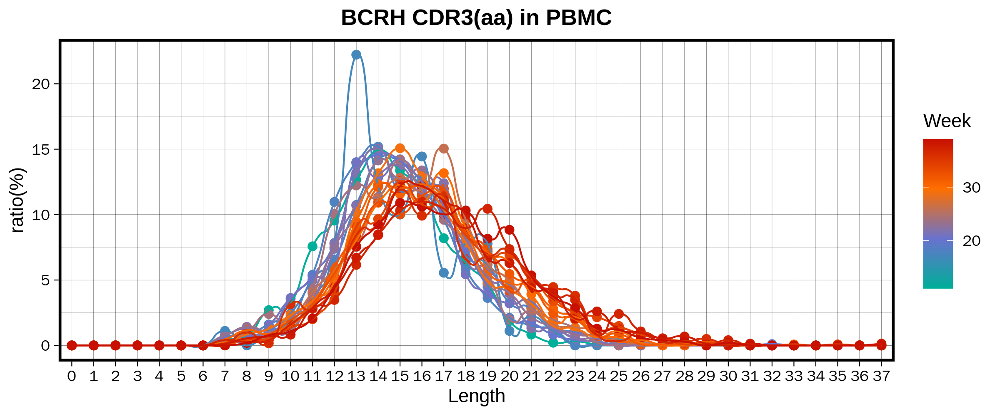

In [22]:
%%R -w 2400 -h 1000 -r 300 -i BCRH_ratio
library(tidyverse)
library(reshape2)
library(ggplot2)
library(dplyr)
library(RColorBrewer )
plot_PBMC_sum_ratio <- function(PBMC_sums_ratio, plot_title = 'BCR IGH CDR3(aa) in PBMC') {
  PBMC_sum_ratio <- rownames_to_column(PBMC_sums_ratio)
  PBMC_sum_ratio <- melt(PBMC_sum_ratio, id = c("rowname"))
  PBMC_sum_ratio$rowname <- factor(PBMC_sum_ratio$rowname, level = unique(PBMC_sum_ratio$rowname))

  colnames(PBMC_sum_ratio) <- c('Length', 'Sample', 'ratio')
  PBMC_sum_ratio$ratio <- PBMC_sum_ratio$ratio * 100
  
 PBMC_sum_ratio$Week <- as.numeric(substring(PBMC_sum_ratio$Sample,2,4))

p <- ggplot(PBMC_sum_ratio, aes(Length, ratio, color = Week, group=Sample)) +
  geom_point(size=2) +
#   geom_line() +
    geom_xspline(spline_shape = -0.8)+
#   geom_smooth(se=F,size=0.3) +
  ggtitle(plot_title) +
  theme_linedraw() +
  xlab('Length') +
  ylab('ratio(%)') +
  theme(plot.title = element_text(hjust = 0.5, size = 13, face = "bold"),
       panel.border = element_rect(linetype = "solid", colour = "black", size = 1.5))

print(p)

  return(p)
}
my_plot <- plot_PBMC_sum_ratio(BCRH_ratio, plot_title = 'BCRH CDR3(aa) in PBMC')+
scale_color_gradientn(colours = rev(colorRampPalette(c("#C71000B2","#FF6F00B2","#6a73cf","#00AF99" ))(100)))
print(my_plot)

`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'


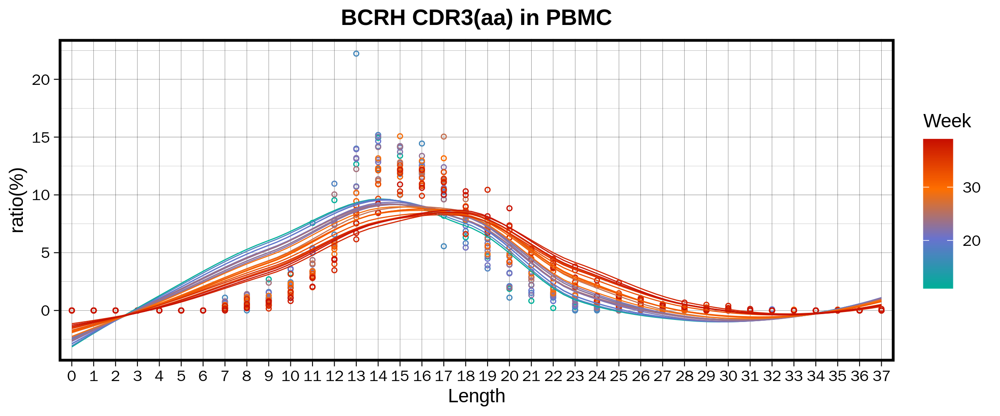

In [23]:
%%R -w 2400 -h 1000 -r 300 -i BCRH_ratio
library(tidyverse)
library(reshape2)
library(ggplot2)
library(dplyr)
library(RColorBrewer )
plot_PBMC_sum_ratio <- function(PBMC_sums_ratio, plot_title = 'BCR IGH CDR3(aa) in PBMC') {
  PBMC_sum_ratio <- rownames_to_column(PBMC_sums_ratio)
  PBMC_sum_ratio <- melt(PBMC_sum_ratio, id = c("rowname"))
  PBMC_sum_ratio$rowname <- factor(PBMC_sum_ratio$rowname, level = unique(PBMC_sum_ratio$rowname))

  colnames(PBMC_sum_ratio) <- c('Length', 'Sample', 'ratio')
  PBMC_sum_ratio$ratio <- PBMC_sum_ratio$ratio * 100
  
 PBMC_sum_ratio$Week <- as.numeric(substring(PBMC_sum_ratio$Sample,2,4))

p <- ggplot(PBMC_sum_ratio, aes(Length, ratio, color = Week, group=Sample)) +
  geom_point(shape=1,size=1) +
#   geom_line() +
  geom_smooth(se=F,size=0.3) +
  ggtitle(plot_title) +
  theme_linedraw() +
  xlab('Length') +
  ylab('ratio(%)') +
  theme(plot.title = element_text(hjust = 0.5, size = 13, face = "bold"),
       panel.border = element_rect(linetype = "solid", colour = "black", size = 1.5))

print(p)

  return(p)
}
BCRH_plot <- plot_PBMC_sum_ratio(BCRH_ratio, plot_title = 'BCRH CDR3(aa) in PBMC')+
scale_color_gradientn(colours = rev(colorRampPalette(c("#C71000B2","#FF6F00B2","#6a73cf","#00AF99" ))(100)))
print(BCRH_plot)
ggsave(plot = BCRH_plot, filename ='/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Main_Figure5/FigureI_BCRH_CDR3time.pdf', width = 8, height = 5)

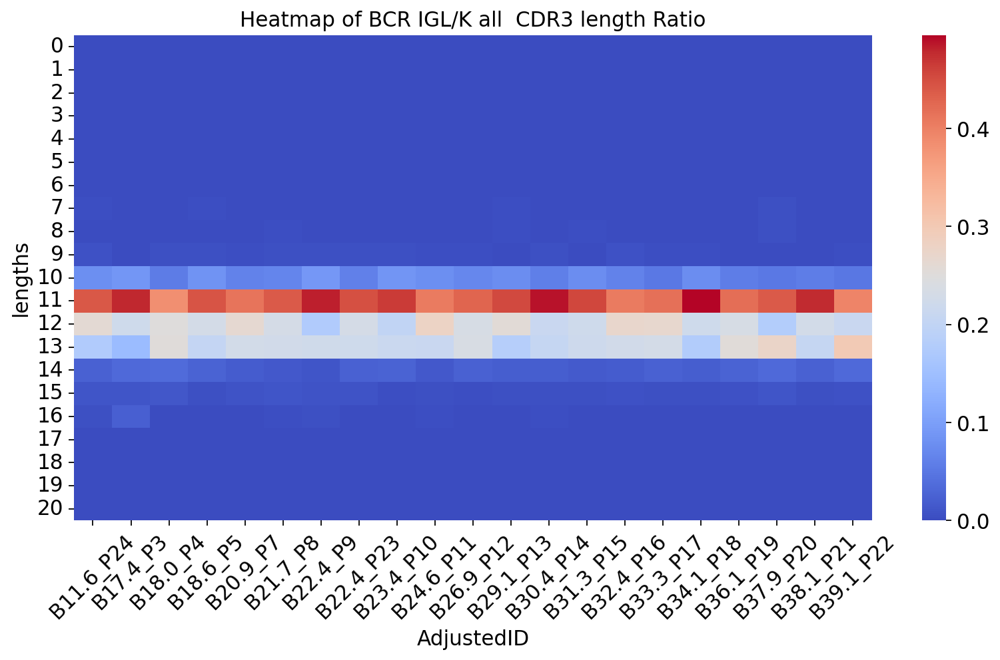

In [24]:
import anndata
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scirpy as ir
def BCR_All_plot_heatmap(adata,col='IR_VDJ_1_junction_aa',title='BCR all',groupSample="AdjustedID"):
    filtered_adata=adata
    df = ir.tl.spectratype(filtered_adata, target_col=groupSample,groupby=col)

    df_sums = df.sum(axis=0)
    df_sums_ratio = df.div(df_sums, axis=1)

    plt.figure(figsize=(12, 6))
    sns.heatmap(df_sums_ratio, xticklabels=True, cmap='coolwarm')
    plt.title(f'Heatmap of {title}  CDR3 length Ratio')
    plt.xticks(rotation=45)  
    plt.show()
    return df_sums_ratio
BCRL_ratio=BCR_All_plot_heatmap(adata_PBMC,col='IR_VJ_1_junction_aa',title='BCR IGL/K all')

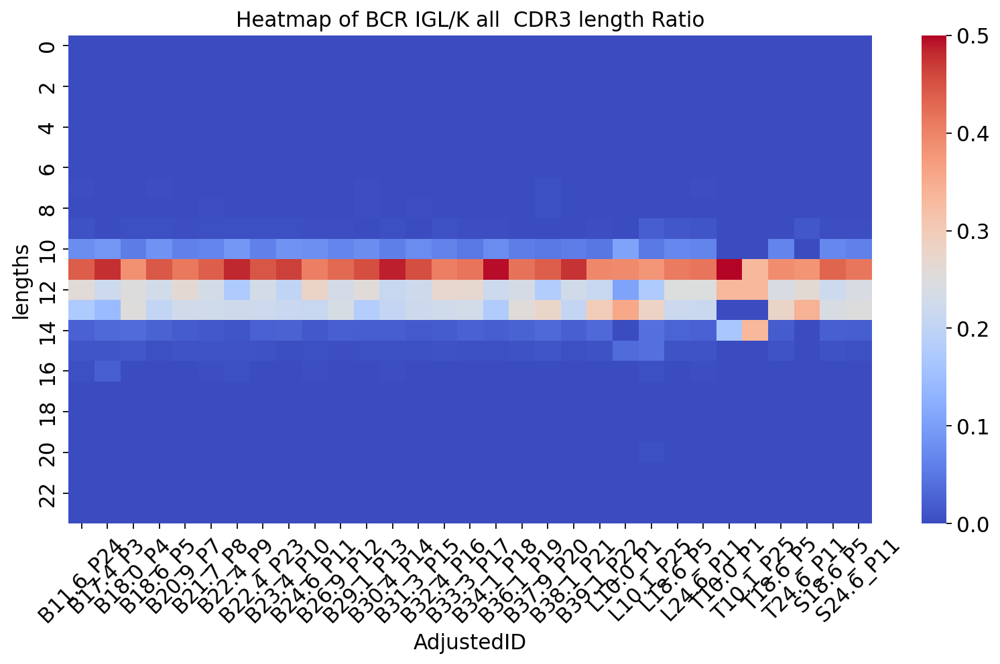

In [25]:
BCRL_ratio_all=BCR_All_plot_heatmap(adata_noT12,col='IR_VJ_1_junction_aa',title='BCR IGL/K all')

In [26]:
BCRL_ratio_all

AdjustedID,B11.6_P24,B17.4_P3,B18.0_P4,B18.6_P5,B20.9_P7,B21.7_P8,B22.4_P9,B22.4_P23,B23.4_P10,B24.6_P11,...,L10.0_P1,L10.1_P25,L18.6_P5,L24.6_P11,T10.0_P1,T10.1_P25,T18.6_P5,T24.6_P11,S18.6_P5,S24.6_P11
lengths,,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000618,0.000000,0.000000,0.000000,0.000000,0.000000,0.000214
7,0.002075,0.000000,0.000000,0.002036,0.000000,0.001395,0.000000,0.000000,0.000949,0.000000,...,0.000000,0.000000,0.000903,0.003090,0.000000,0.000000,0.000000,0.000000,0.001262,0.000428
8,0.001037,0.000000,0.001688,0.000509,0.001017,0.002789,0.000000,0.000863,0.000949,0.000000,...,0.000000,0.000000,0.000000,0.001236,0.000000,0.000000,0.000000,0.000000,0.000757,0.001069


In [27]:
%%R -w 2400 -h 1000 -r 300 -i BCRL_ratio_all
library(tidyverse)
library(reshape2)
library(ggplot2)
library(dplyr)
library(RColorBrewer )
Cal_PBMC_sum_ratio <- function(PBMC_sums_ratio, plot_title ) {
  PBMC_sum_ratio <- rownames_to_column(PBMC_sums_ratio)
  PBMC_sum_ratio <- melt(PBMC_sum_ratio, id = c("rowname"))
  PBMC_sum_ratio$rowname <- factor(PBMC_sum_ratio$rowname, level = unique(PBMC_sum_ratio$rowname))

  colnames(PBMC_sum_ratio) <- c('Length', 'Sample', 'ratio')
  PBMC_sum_ratio$ratio <- PBMC_sum_ratio$ratio * 100
  
 PBMC_sum_ratio$Week <- as.numeric(substring(PBMC_sum_ratio$Sample,2,5))
    PBMC_sum_ratio <- PBMC_sum_ratio %>% group_by(Length) %>% filter(sum(as.numeric(ratio) )!= 0) %>%ungroup()
     PBMC_sum_ratio$Organ <- substring(PBMC_sum_ratio$Sample,1,1)
return( PBMC_sum_ratio)
}

BCRL_ratio_alllong <- Cal_PBMC_sum_ratio(BCRL_ratio_all)
head(BCRL_ratio_alllong)

# A tibble: 6 × 5
  Length Sample     ratio  Week Organ
  <fct>  <fct>      <dbl> <dbl> <chr>
1 6      B11.6_P24  0      11.6 B    
2 7      B11.6_P24  0.207  11.6 B    
3 8      B11.6_P24  0.104  11.6 B    
4 9      B11.6_P24  0.726  11.6 B    
5 10     B11.6_P24  7.78   11.6 B    
6 11     B11.6_P24 44.0    11.6 B    


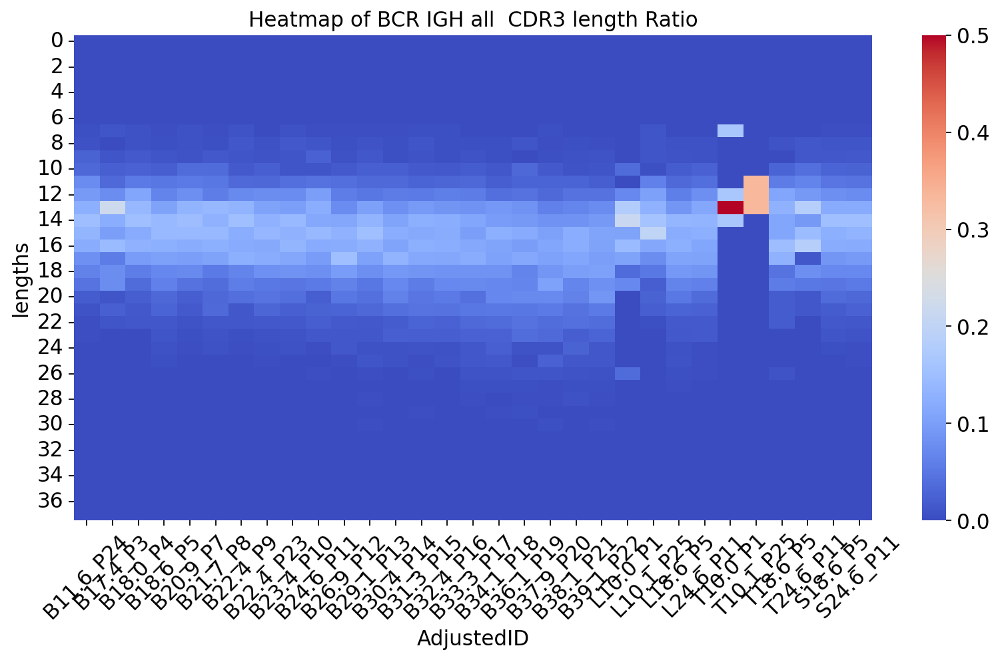

In [28]:
BCRH_ratio_all=BCR_All_plot_heatmap(adata_noT12,col='IR_VDJ_1_junction_aa',title='BCR IGH all')

[1] FALSE


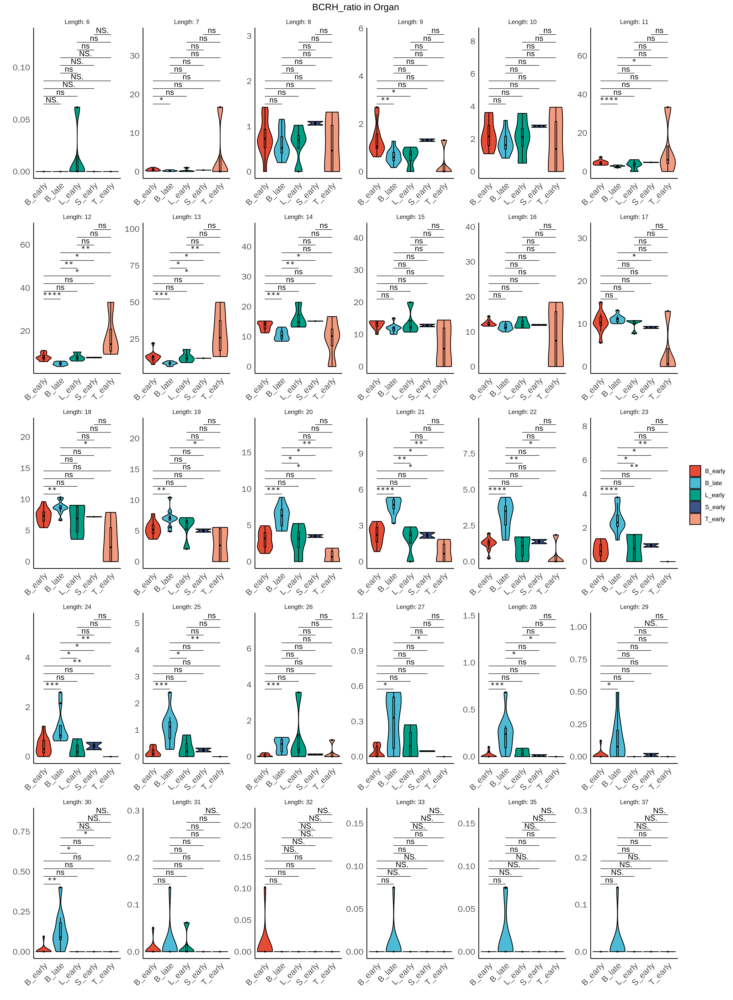

In [29]:
%%R -w 4400 -h 6000 -r 300 -i BCRH_ratio_all
BCRH_ratio_alllong <- Cal_PBMC_sum_ratio(BCRH_ratio_all)
head(BCRH_ratio_alllong)

library(ggsci)
library(tidyverse)
library(ggplot2)
library(ggpubr)

# 创建新列 "Date" 和 "Organdate"
BCRH_ratio_alllong <- BCRH_ratio_alllong %>%
  mutate(Date = ifelse(Week > 28, "late", "early"),
         Organdate = paste(Organ, Date, sep = "_"))

# 设置比较组



levels <- unique(BCRH_ratio_alllong$Organdate)


# my_comparisons <- apply(combinations, 2, function(x) {list(x[1], x[2])})
my_comparisons <- list(c("B_early", "B_late"))
my_comparisons <- list(
  c("B_early", "B_late"),
  c("B_early", "L_early"),
  c("B_early", "S_early"),
  c("B_early", "T_early"),
  c("B_late", "L_early"),
  c("B_late", "S_early"),
  c("B_late", "T_early"),
  c("L_early", "S_early"),
  c("L_early", "T_early"),
  c("S_early", "T_early")
)
p <- ggplot(BCRH_ratio_alllong, aes(x = Organdate, y = ratio, fill = Organdate)) +
  geom_violin(position = position_dodge(width = 1), scale = 'width', color = "black") +
  geom_boxplot(position = position_dodge(width = 1), outlier.size = 0.7, width = 0.1, show.legend = FALSE, color = "black") +
  stat_compare_means(comparisons = my_comparisons, label = "p.signif", tip.length = 0) +
  facet_wrap(~Length, scales = "free", labeller = label_both) +  
  theme_minimal() +
  theme(panel.grid = element_blank(), 
        panel.background = element_blank(), 
        panel.border = element_blank(),
        axis.line = element_line(color = "black"),
        axis.text.x = element_text(size = 12, angle = 45, hjust = 1), 
        axis.text.y = element_text(size = 12),
        plot.title = element_text(hjust = 0.5),
        legend.title = element_blank(), 
        legend.key = element_blank()) +
  labs(x = '', y = '', title = 'BCRH_ratio in Organ')+scale_fill_npg()


print(p)


In [30]:
%%R
# my_comparisons 
my_comparisons <- list(c("B_early", "B_late"))
my_comparisons 

[[1]]
[1] "B_early" "B_late" 



In [31]:
%%R
unique(BCRL_ratio_alllong$Organdate)

NULL


[1] FALSE


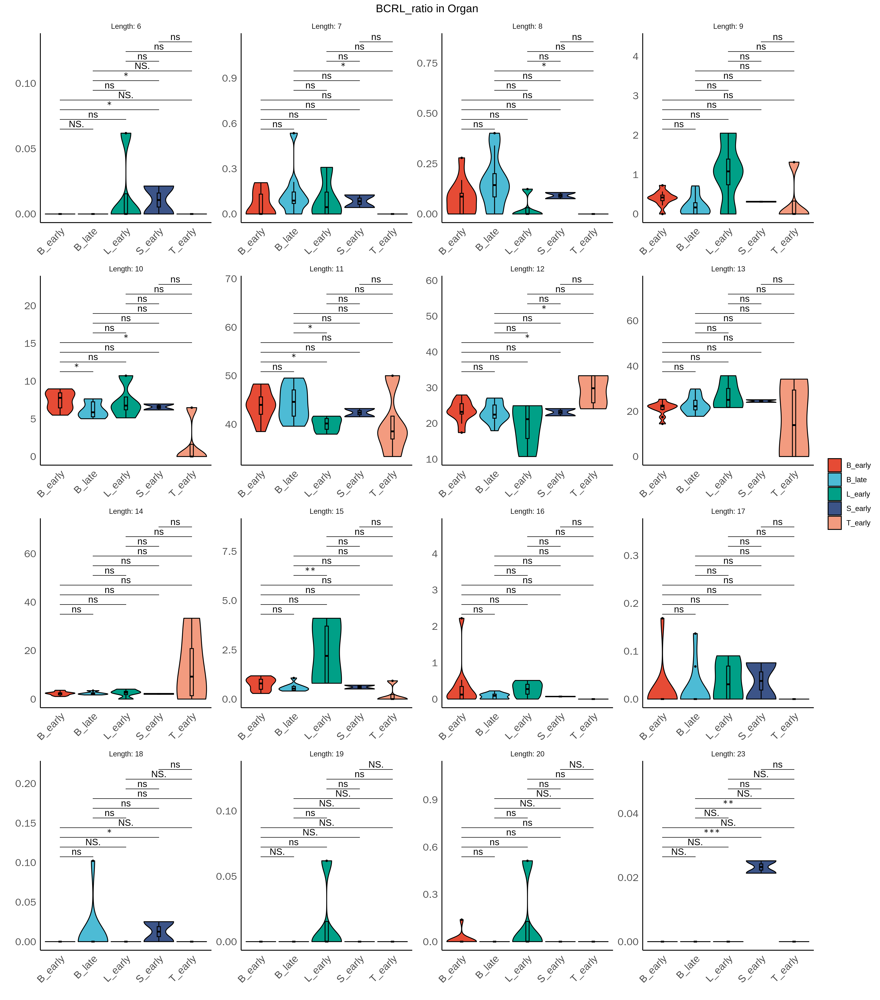

In [32]:
%%R -w 4400 -h 5000 -r 300 


library(ggsci)
library(tidyverse)
library(ggplot2)
library(ggpubr)


BCRL_ratio_alllong <- BCRL_ratio_alllong %>%
  mutate(Date = ifelse(Week > 28, "late", "early"),
         Organdate = paste(Organ, Date, sep = "_"))





levels <- unique(BCRL_ratio_alllong$Organdate)



elements <- c("B_early", "B_late", "L_early", "S_early", "T_early")

combinations <- combn(elements, 2)

my_comparisons <- apply(combinations, 2, function(x) list(x[1], x[2]))

# 打印结果
# print(my_comparisons)


# my_comparisons <- apply(combinations, 2, function(x) {list(x[1], x[2])})
my_comparisons <- list(c("B_early", "B_late"))
my_comparisons <- list(
  c("B_early", "B_late"),
  c("B_early", "L_early"),
  c("B_early", "S_early"),
  c("B_early", "T_early"),
  c("B_late", "L_early"),
  c("B_late", "S_early"),
  c("B_late", "T_early"),
  c("L_early", "S_early"),
  c("L_early", "T_early"),
  c("S_early", "T_early")
)
p <- ggplot(BCRL_ratio_alllong, aes(x = Organdate, y = ratio, fill = Organdate)) +
  geom_violin(position = position_dodge(width = 1), scale = 'width', color = "black") +
  geom_boxplot(position = position_dodge(width = 1), outlier.size = 0.7, width = 0.1, show.legend = FALSE, color = "black") +
  stat_compare_means(comparisons = my_comparisons, label = "p.signif", tip.length = 0) +
  facet_wrap(~Length, scales = "free", labeller = label_both) +  
  theme_minimal() +
  theme(panel.grid = element_blank(), 
        panel.background = element_blank(), 
        panel.border = element_blank(),
        axis.line = element_line(color = "black"),
        axis.text.x = element_text(size = 12, angle = 45, hjust = 1), 
        axis.text.y = element_text(size = 12),
        plot.title = element_text(hjust = 0.5),
        legend.title = element_blank(), 
        legend.key = element_blank()) +
  labs(x = '', y = '', title = 'BCRL_ratio in Organ')+scale_fill_npg()


print(p)

`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'


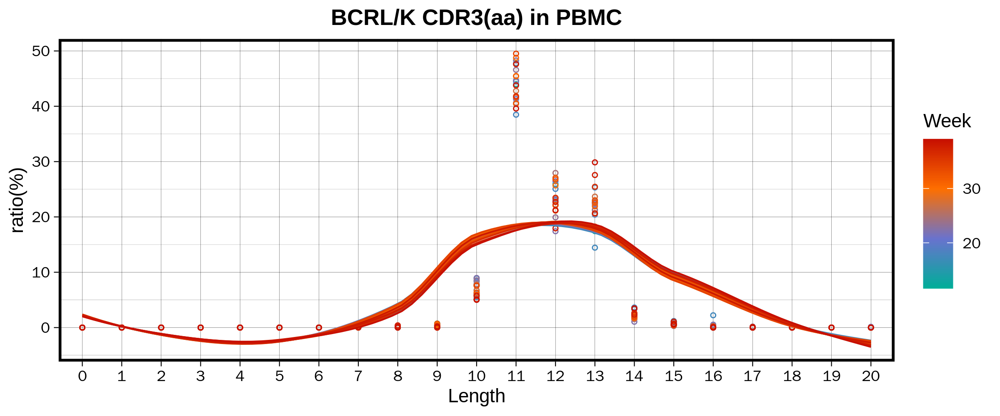

In [33]:
%%R -w 2400 -h 1000 -r 300 -i BCRL_ratio
library(tidyverse)
library(reshape2)
library(ggplot2)
library(dplyr)
library(RColorBrewer )
plot_PBMC_sum_ratio <- function(PBMC_sums_ratio, plot_title = 'BCR IGH CDR3(aa) in PBMC') {
  PBMC_sum_ratio <- rownames_to_column(PBMC_sums_ratio)
  PBMC_sum_ratio <- melt(PBMC_sum_ratio, id = c("rowname"))
  PBMC_sum_ratio$rowname <- factor(PBMC_sum_ratio$rowname, level = unique(PBMC_sum_ratio$rowname))

  colnames(PBMC_sum_ratio) <- c('Length', 'Sample', 'ratio')
  PBMC_sum_ratio$ratio <- PBMC_sum_ratio$ratio * 100
  
 PBMC_sum_ratio$Week <- as.numeric(substring(PBMC_sum_ratio$Sample,2,5))

p <- ggplot(PBMC_sum_ratio, aes(Length, ratio, color = Week, group=Sample)) +
  geom_point(shape=1,size=1) +
  geom_smooth(se=F,size=0.5) +
  ggtitle(plot_title) +
  theme_linedraw() +
  xlab('Length') +
  ylab('ratio(%)') +
  theme(plot.title = element_text(hjust = 0.5, size = 13, face = "bold"),
        panel.border = element_rect(linetype = "solid", colour = "black", size = 1.5)) 

print(p)

  return(p)
}
BCRLK<- plot_PBMC_sum_ratio(BCRL_ratio, plot_title = 'BCRL/K CDR3(aa) in PBMC')+
scale_color_gradientn(colours = rev(colorRampPalette(c("#C71000B2","#FF6F00B2","#6a73cf","#00AF99" ))(100)))
# scale_color_gradientn(colours = rev(colorRampPalette(brewer.pal(9, "Spectral"))(100)))
print(BCRLK)
ggsave(plot = BCRLK, filename ='/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Main_Figure5/FigureI_BCRLK_CDR3time.pdf', width = 8, height = 5)

In [34]:
BCRH_ratio
import pandas as pd


BCRHlong_ratio = BCRH_ratio.reset_index().melt(id_vars='lengths', var_name='AdjustedID', value_name='proportion')
BCRHlong_ratio['week'] = BCRHlong_ratio['AdjustedID'].str.extract('B(\d+\.\d+)_P', expand=False).astype(float)

# print(df)
# BCRHlong_ratio.rename(columns={'lengths': 'subject'}, inplace=True)

print(BCRHlong_ratio )

import statsmodels.api as sm
import statsmodels.formula.api as smf


BCRHlong_ratio['time'] = BCRHlong_ratio['week'].astype(float)


model = smf.mixedlm("proportion ~ time * lengths", BCRHlong_ratio, groups=BCRHlong_ratio['lengths'])
result = model.fit()
print(result.summary())



     lengths AdjustedID  proportion  week
0          0  B11.6_P24         0.0  11.6
1          1  B11.6_P24         0.0  11.6
2          2  B11.6_P24         0.0  11.6
3          3  B11.6_P24         0.0  11.6
4          4  B11.6_P24         0.0  11.6
..       ...        ...         ...   ...
793       33  B39.1_P22         0.0  39.1
794       34  B39.1_P22         0.0  39.1
795       35  B39.1_P22         0.0  39.1
796       36  B39.1_P22         0.0  39.1
797       37  B39.1_P22         0.0  39.1

[798 rows x 4 columns]
         Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: proportion
No. Observations: 798     Method:             REML      
No. Groups:       38      Scale:              0.0001    
Min. group size:  21      Log-Likelihood:     2340.9630 
Max. group size:  21      Converged:          Yes       
Mean group size:  21.0                                  
--------------------------------------------------------
              Coef.  Std.E

/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


                            OLS Regression Results                            
Dep. Variable:                lengths   R-squared:                       0.260
Model:                            OLS   Adj. R-squared:                  0.219
Method:                 Least Squares   F-statistic:                     6.319
Date:                   五, 02 2月 2024   Prob (F-statistic):             0.0217
Time:                        10:39:57   Log-Likelihood:                -27.420
No. Observations:                  20   AIC:                             58.84
Df Residuals:                      18   BIC:                             60.83
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     12.8618      0.822     15.642      0.0

Text(0, 0.5, 'CDR3(aa) length Peak Location')

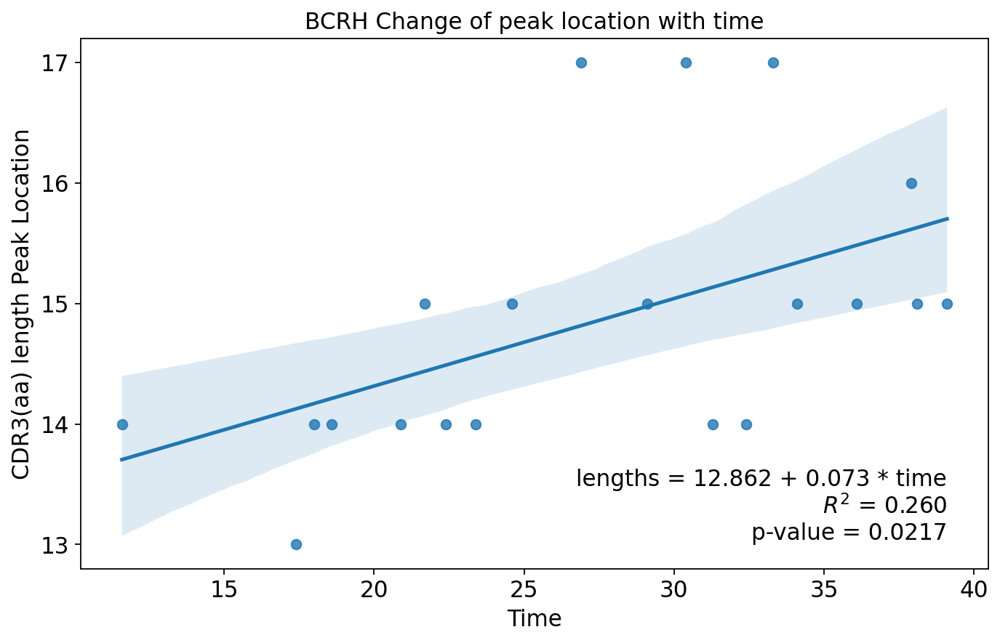

In [73]:
import matplotlib.pyplot as plt
import seaborn as sns

import statsmodels.formula.api as smf


peak_BCRHlong_ratio = BCRHlong_ratio.groupby('time')['proportion'].idxmax()


peak_locs = BCRHlong_ratio.loc[peak_BCRHlong_ratio][['time', 'lengths']]

model = smf.ols(formula='lengths ~ time', data=peak_locs)
results = model.fit()
print(results.summary())


plt.figure(figsize=(10, 6))
sns.regplot(x='time', y='lengths', data=peak_locs, ci=95) # 默认会显示95%置信区间


plt.text(x=max(peak_locs['time']), y=min(peak_locs['lengths']),
         s=f'lengths = {results.params["Intercept"]:.3f} + {results.params["time"]:.3f} * time\n'
           f'$R^2$ = {results.rsquared:.3f}\n'
           f'p-value = {results.f_pvalue:.3g}', # 使用科学计数法格式化p-value
         horizontalalignment='right', verticalalignment='bottom')


plt.gca().yaxis.set_major_locator(ticker.MaxNLocator(integer=True))


plt.title('BCRH Change of peak location with time')
plt.xlabel('Time')
plt.ylabel('CDR3(aa) length Peak Location')


# plt.savefig('/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Sup_Figure4/S28/S28_TRApeak_location_change.png', dpi=300, bbox_inches='tight')
# plt.show()

/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/statsmodels/regression/linear_model.py:1752: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss


                            OLS Regression Results                            
Dep. Variable:                lengths   R-squared:                        -inf
Model:                            OLS   Adj. R-squared:                   -inf
Method:                 Least Squares   F-statistic:                    -18.00
Date:                   五, 02 2月 2024   Prob (F-statistic):               1.00
Time:                        11:05:57   Log-Likelihood:                 625.65
No. Observations:                  20   AIC:                            -1247.
Df Residuals:                      18   BIC:                            -1245.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     11.0000   5.42e-15   2.03e+15      0.0

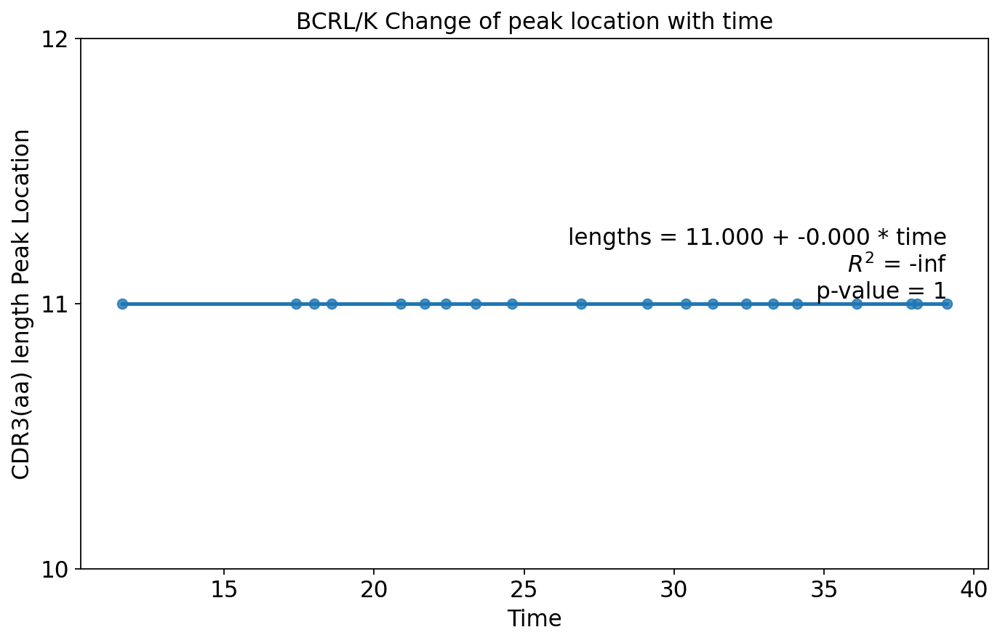

In [90]:
import matplotlib.pyplot as plt
import seaborn as sns

import statsmodels.formula.api as smf


peak_BCRLlong_ratio = BCRLlong_ratio.groupby('time')['proportion'].idxmax()


peak_locs = BCRLlong_ratio.loc[peak_BCRLlong_ratio][['time', 'lengths']]

model = smf.ols(formula='lengths ~ time', data=peak_locs)
results = model.fit()
print(results.summary())


plt.figure(figsize=(10, 6))
sns.regplot(x='time', y='lengths', data=peak_locs, ci=95) # 默认会显示95%置信区间


plt.text(x=max(peak_locs['time']), y=min(peak_locs['lengths']),
         s=f'lengths = {results.params["Intercept"]:.3f} + {results.params["time"]:.3f} * time\n'
           f'$R^2$ = {results.rsquared:.3f}\n'
           f'p-value = {results.f_pvalue:.3g}', # 使用科学计数法格式化p-value
         horizontalalignment='right', verticalalignment='bottom')


# plt.gca().yaxis.set_major_locator(ticker.MaxNLocator(integer=True))
plt.ylim(10, 12)  # Set the limits to be around the value 11
plt.yticks([10, 11, 12])
plt.title('BCRL/K Change of peak location with time')
plt.xlabel('Time')
plt.ylabel('CDR3(aa) length Peak Location')


plt.savefig('/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Sup_Figure4/S28/S28_TRApeak_location_change.png', dpi=300, bbox_inches='tight')
plt.show()

In [86]:
peak_locs

,time,lengths
11,11.6,11
32,17.4,11
53,18.0,11
74,18.6,11
95,20.9,11
116,21.7,11
137,22.4,11
179,23.4,11
200,24.6,11
221,26.9,11


In [35]:

import pandas as pd
from scipy import stats
results = []

grouped = BCRHlong_ratio.groupby('lengths')

for name, group in grouped:

    correlation, p_value = stats.spearmanr(group['week'], group['proportion'])
    
    results.append({
        'lengths': name,
        'R_value': correlation,
        'p_value': p_value
    })

BCRHresults_df = pd.DataFrame(results)

print(BCRHresults_df)

/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


    lengths   R_value       p_value
0         0       NaN           NaN
1         1       NaN           NaN
2         2       NaN           NaN
3         3       NaN           NaN
4         4       NaN           NaN
5         5       NaN           NaN
6         6       NaN           NaN
7         7 -0.625081  2.446671e-03
8         8 -0.222800  3.316712e-01
9         9 -0.755440  7.507857e-05
10       10 -0.558623  8.484162e-03
11       11 -0.857421  6.833511e-07
12       12 -0.863917  4.505909e-07
13       13 -0.865866  3.960261e-07
14       14 -0.853524  8.689231e-07
15       15 -0.378694  9.048337e-02
16       16 -0.591101  4.774336e-03
17       17  0.372199  9.661196e-02
18       18  0.729458  1.751915e-04
19       19  0.642416  1.687868e-03
20       20  0.891198  6.007512e-08
21       21  0.867814  3.473692e-07
22       22  0.960702  4.977651e-12
23       23  0.920429  3.456739e-09
24       24  0.852225  9.399416e-07
25       25  0.741287  1.205701e-04
26       26  0.826267  3.929

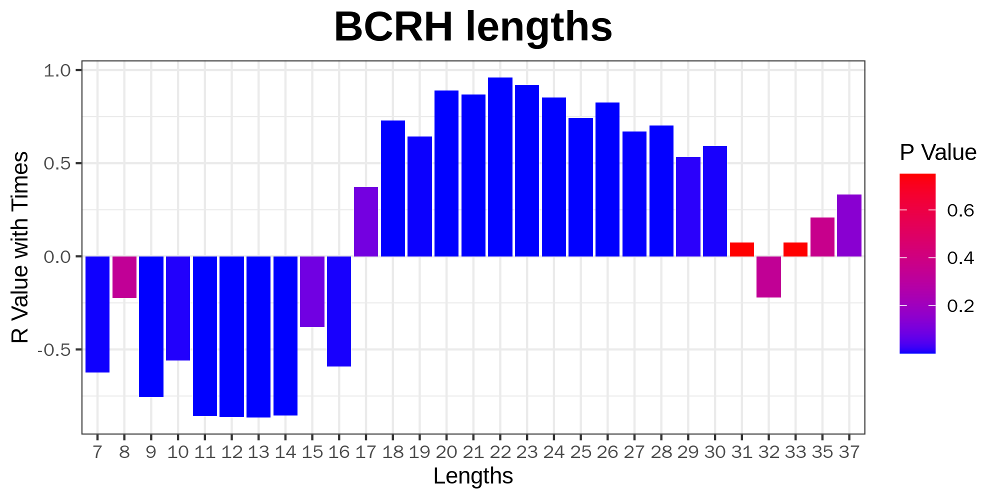

In [36]:
%%R -w 2000 -h 1000 -r 300 -i BCRHresults_df
library(ggplot2)

BCRHresults_df<- na.omit(BCRHresults_df)

ggplot(BCRHresults_df, aes(x = factor(lengths), y = R_value, fill = p_value)) +
    geom_bar(stat = "identity") +
    scale_fill_gradient(low = "blue", high = "red") +
    labs(x = "Lengths", y = "R Value with Times", fill = "P Value") +
    theme_bw()+ggtitle("BCRH lengths")+ 
theme(plot.title = element_text(hjust = 0.5, size = 20, face = "bold"))


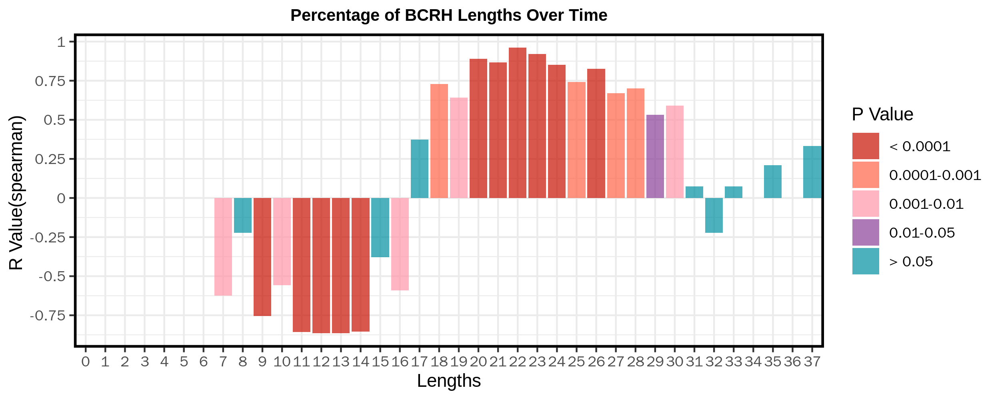

In [37]:
%%R -w 2500 -h 1000 -r 300 -i BCRHresults_df
create_pval_plot <- function(df,titlex) {
 
  df$pvalue_cat <- cut(df$p_value,
                       breaks = c(0, 0.0001, 0.001, 0.01, 0.05, Inf),
                       
                       labels = c('< 0.0001', '0.0001-0.001', '0.001-0.01',
                                  '0.01-0.05', '> 0.05'),
                       include.lowest = TRUE)

  

  colors <- c('< 0.0001' = "#C71000B2", '0.0001-0.001' =  "#FF6348B2", 
              '0.001-0.01' = "#FF95A8B2", '0.01-0.05' = "#8A4198B2" ,
              '> 0.05' ="#008EA0B2" )

 
  plot <- ggplot(df, aes(x = factor(lengths), y = R_value, fill = pvalue_cat)) +
      geom_bar(stat = "identity") +
      scale_fill_manual(values = colors) +
      labs(x = "Lengths", y = "R Value(spearman) ", fill = "P Value") +
      theme_bw() +
      ggtitle(titlex) + 
      theme(plot.title = element_text(hjust = 0.5, size = 10, face = "bold"),
           panel.border = element_rect(linetype = "solid", colour = "black", size = 1.5)) + 
      scale_y_continuous(breaks = seq(-1, 1, by = 0.25), labels = seq(-1, 1, by = 0.25))
  
  return(plot)
}


BCRHpval_plot <- create_pval_plot(
    BCRHresults_df,titlex="Percentage of BCRH Lengths Over Time")
print(BCRHpval_plot)
ggsave(plot = BCRHpval_plot, filename ='/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Main_Figure5/FigureI_BCRH_CDR3_BCRHpval_plot.pdf', width = 8, height = 3)

In [38]:
BCRL_ratio
import pandas as pd


BCRLlong_ratio = BCRL_ratio.reset_index().melt(id_vars='lengths', var_name='AdjustedID', value_name='proportion')
BCRLlong_ratio['week'] = BCRLlong_ratio['AdjustedID'].str.extract('B(\d+\.\d+)_P', expand=False).astype(float)

# print(df)
# BCRLlong_ratio.rename(columns={'lengths': 'subject'}, inplace=True)

print(BCRLlong_ratio )

import statsmodels.api as sm
import statsmodels.formula.api as smf


BCRLlong_ratio['time'] = BCRLlong_ratio['week'].astype(float)


model = smf.mixedlm("proportion ~ time * lengths", BCRLlong_ratio, groups=BCRLlong_ratio['lengths'])
result = model.fit()
print(result.summary())



     lengths AdjustedID  proportion  week
0          0  B11.6_P24         0.0  11.6
1          1  B11.6_P24         0.0  11.6
2          2  B11.6_P24         0.0  11.6
3          3  B11.6_P24         0.0  11.6
4          4  B11.6_P24         0.0  11.6
..       ...        ...         ...   ...
436       16  B39.1_P22         0.0  39.1
437       17  B39.1_P22         0.0  39.1
438       18  B39.1_P22         0.0  39.1
439       19  B39.1_P22         0.0  39.1
440       20  B39.1_P22         0.0  39.1

[441 rows x 4 columns]
         Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: proportion
No. Observations: 441     Method:             REML      
No. Groups:       21      Scale:              0.0002    
Min. group size:  21      Log-Likelihood:     1203.8009 
Max. group size:  21      Converged:          Yes       
Mean group size:  21.0                                  
--------------------------------------------------------
              Coef.  Std.E

In [39]:

import pandas as pd
from scipy import stats
results = []

grouped = BCRLlong_ratio.groupby('lengths')

for name, group in grouped:

    correlation, p_value = stats.spearmanr(group['week'], group['proportion'])
    
    results.append({
        'lengths': name,
        'R_value': correlation,
        'p_value': p_value
    })

BCRLresults_df = pd.DataFrame(results)

print(BCRLresults_df)

    lengths   R_value   p_value
0         0       NaN       NaN
1         1       NaN       NaN
2         2       NaN       NaN
3         3       NaN       NaN
4         4       NaN       NaN
5         5       NaN       NaN
6         6       NaN       NaN
7         7  0.187718  0.415164
8         8  0.114659  0.620673
9         9 -0.466828  0.032887
10       10 -0.576161  0.006265
11       11 -0.040273  0.862398
12       12 -0.216304  0.346322
13       13  0.373498  0.095363
14       14  0.039623  0.864598
15       15 -0.412472  0.063146
16       16 -0.314979  0.164307
17       17  0.066138  0.775769
18       18  0.184697  0.422846
19       19       NaN       NaN
20       20 -0.184697  0.422846


/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


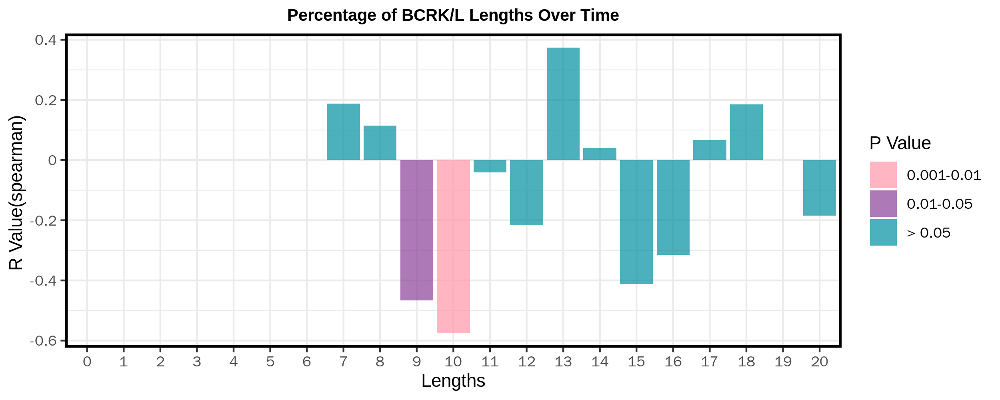

In [40]:
%%R -w 2500 -h 1000 -r 300 -i BCRLresults_df
create_pval_plot <- function(df,titlex) {
 
  df$pvalue_cat <- cut(df$p_value,
                       breaks = c(0, 0.0001, 0.001, 0.01, 0.05, Inf),
                       
                       labels = c('< 0.0001', '0.0001-0.001', '0.001-0.01',
                                  '0.01-0.05', '> 0.05'),
                       include.lowest = TRUE)

  

  colors <- c('< 0.0001' = "#C71000B2", '0.0001-0.001' =  "#FF6348B2", 
              '0.001-0.01' = "#FF95A8B2", '0.01-0.05' = "#8A4198B2" ,
              '> 0.05' ="#008EA0B2" )

 
  plot <- ggplot(df, aes(x = factor(lengths), y = R_value, fill = pvalue_cat)) +
      geom_bar(stat = "identity") +
      scale_fill_manual(values = colors) +
      labs(x = "Lengths", y = "R Value(spearman) ", fill = "P Value") +
      theme_bw() +
      ggtitle(titlex) + 
      theme(plot.title = element_text(hjust = 0.5, size = 10, face = "bold"),
           panel.border = element_rect(linetype = "solid", colour = "black", size = 1.5)) + 
      scale_y_continuous(breaks = seq(-1, 1, by = 0.2), labels = seq(-1, 1, by = 0.2))
  
  return(plot)
}


BCRLpval_plot <- create_pval_plot(
    BCRLresults_df,titlex="Percentage of BCRK/L Lengths Over Time")
print(BCRLpval_plot)
ggsave(plot = BCRLpval_plot, filename ='/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Main_Figure5/FigureI_BCRLpval_plot.pdf', width = 8, height = 3)

In [41]:
# adataPBMC.obs.Last_cell_type

In [42]:
adataPBMC=adata_PBMC

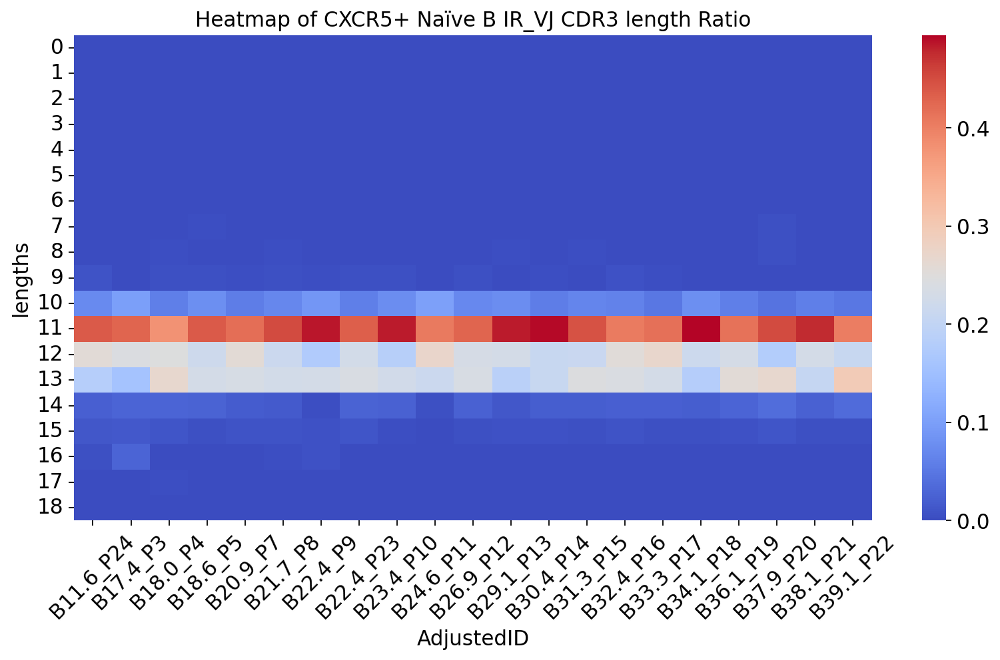

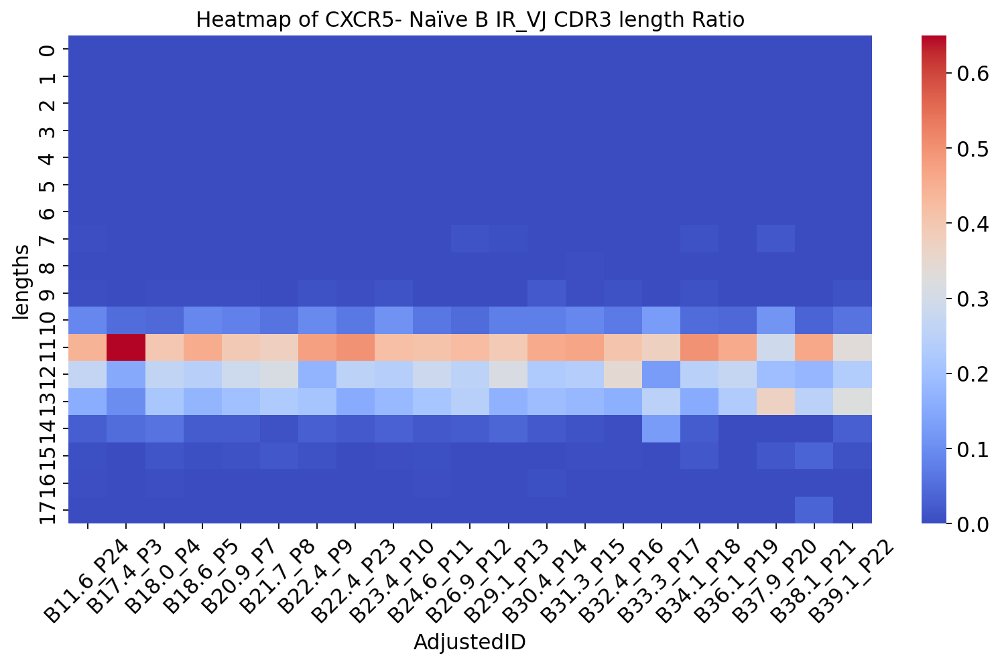

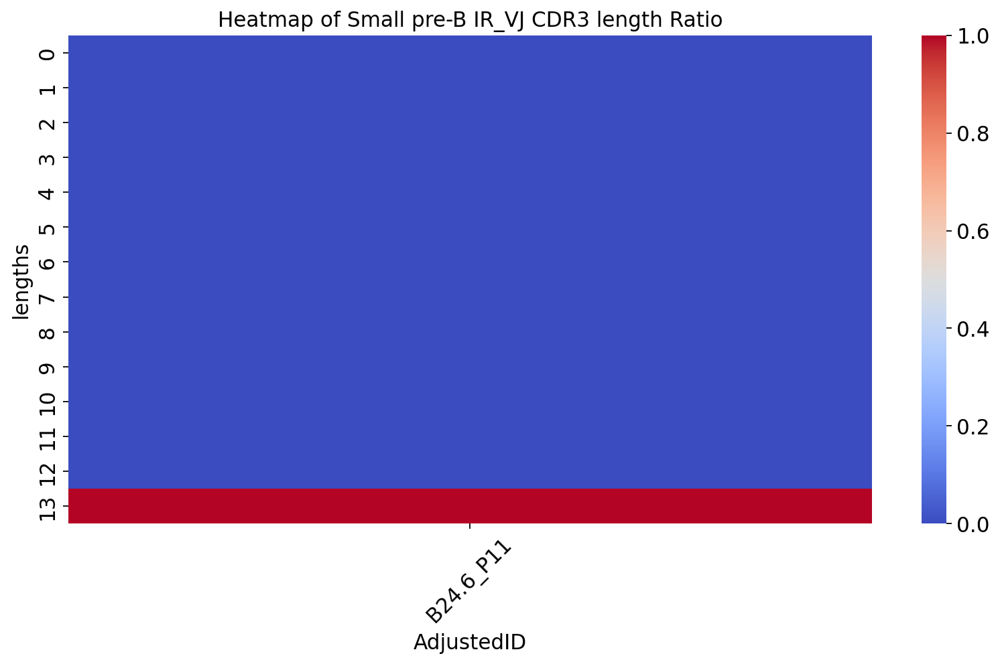

In [43]:
import anndata
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scirpy as ir

# def BCR_All_plot_heatmap(adata,col='IR_VDJ_1_junction_aa',title='BCR all',groupSample="AdjustedID"):
#     filtered_adata=adata
#     df = ir.tl.spectratype(filtered_adata, target_col=groupSample,groupby=col)

def BCR_plot_heatmap_cell_type(adata, cell_type,groupcell='Last_cell_type',col='IR_VDJ_1_junction_aa',title='BCR all',groupSample="AdjustedID"):
    filtered_adata = adata[adata.obs[groupcell] == cell_type]
    df = ir.tl.spectratype(filtered_adata, target_col=groupSample,groupby=col)

    df_sums = df.sum(axis=0)
    df_sums_ratio = df.div(df_sums, axis=1)

    plt.figure(figsize=(12, 6))
    sns.heatmap(df_sums_ratio, xticklabels=True, cmap='coolwarm')
    plt.title(f'Heatmap of {cell_type} IR_VJ CDR3 length Ratio')
    plt.xticks(rotation=45)  
    plt.show()
    return df_sums_ratio

unique_cell_types =  ['CXCR5+ Naïve B', 'CXCR5- Naïve B', 'Small pre-B']

# for cell_type in unique_cell_types:
#     BCR_plot_heatmap(adataPBMC, cell_type)

for cell_type in unique_cell_types:
    cellratio=BCR_plot_heatmap_cell_type(adataPBMC, cell_type,col='IR_VJ_1_junction_aa')
    cellratio.to_csv('/data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/BCR_Figure/BCRdata/PBMC_'+cell_type+'_ratio.csv')

In [44]:
mkdir -p /data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/BCRFigure/BCRH2

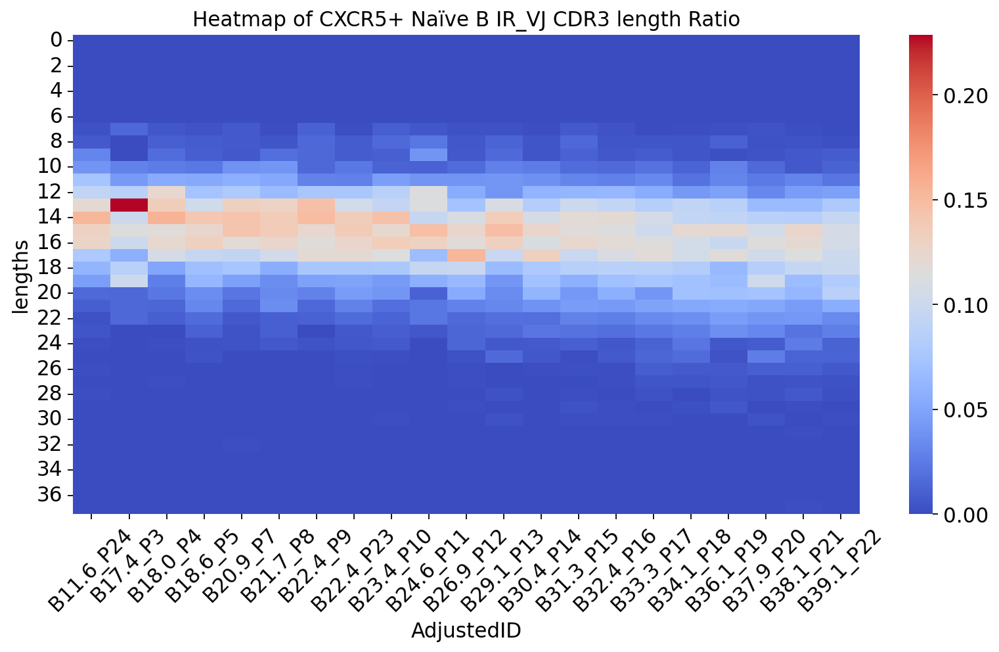

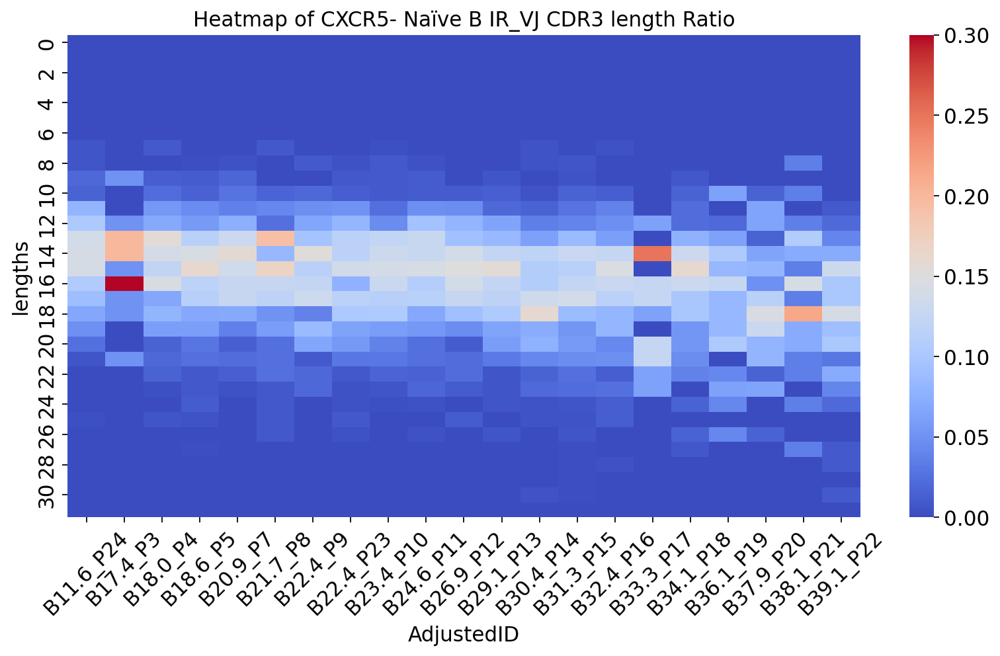

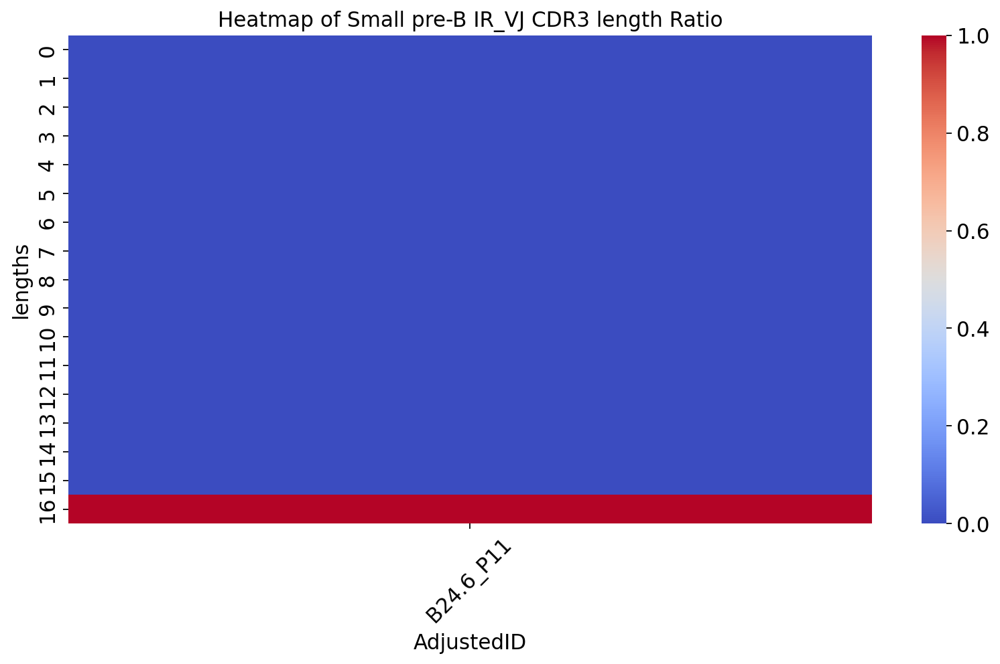

In [45]:
PAths='/data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/BCRFigure/BCRH2/PBMC_'
os.system('rm -rf '+PAths+'/*.csv')
for cell_type in unique_cell_types:
    cellratio=BCR_plot_heatmap_cell_type(adata_PBMC, cell_type,col='IR_VDJ_1_junction_aa',title='BCRH')

    cellratio.to_csv(PAths+cell_type+'_ratio.csv')

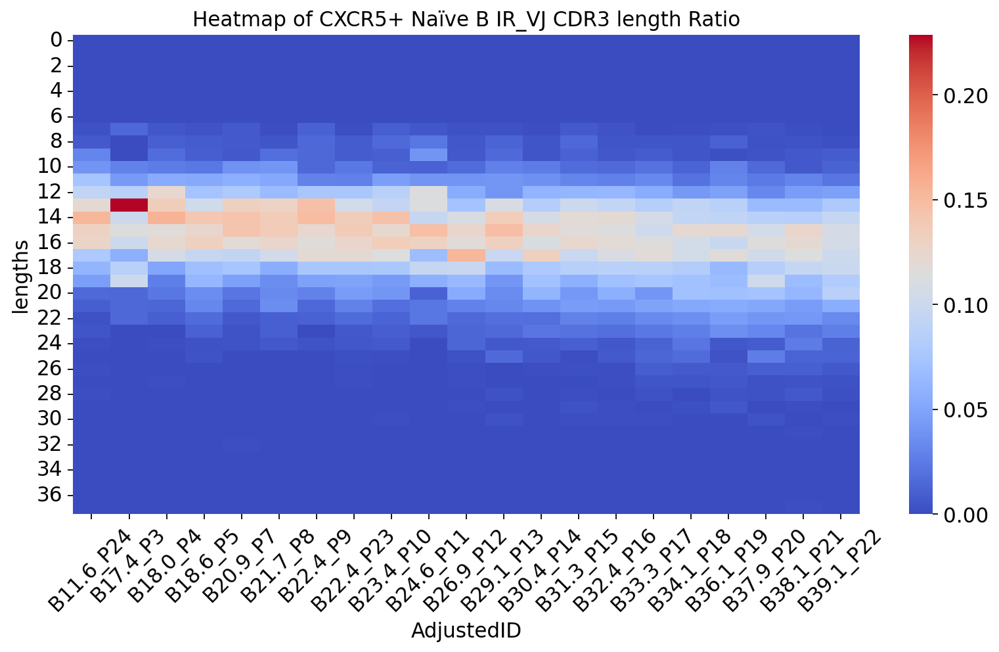

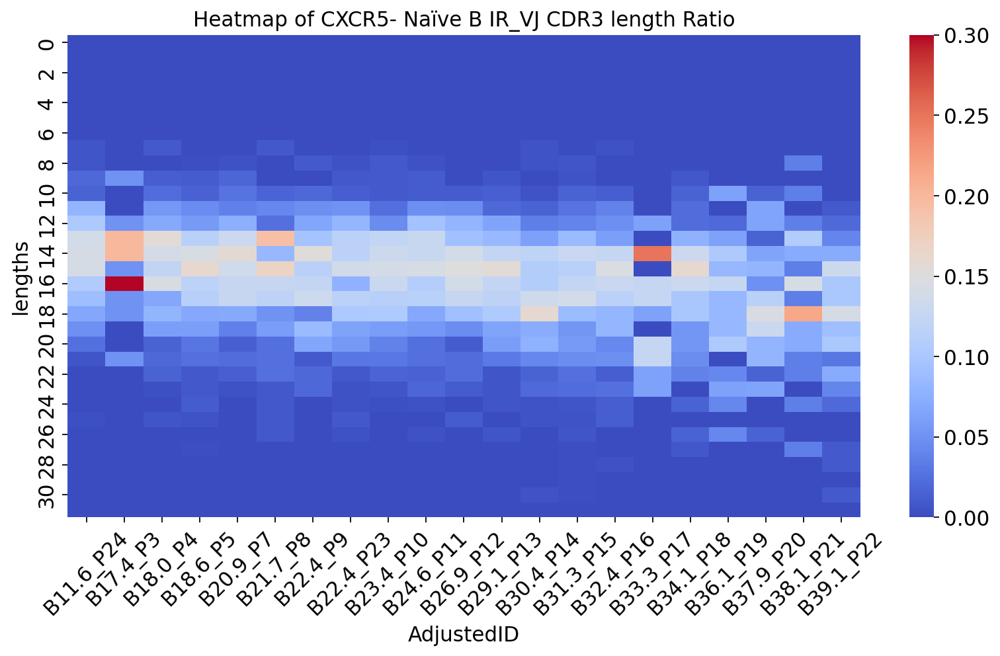

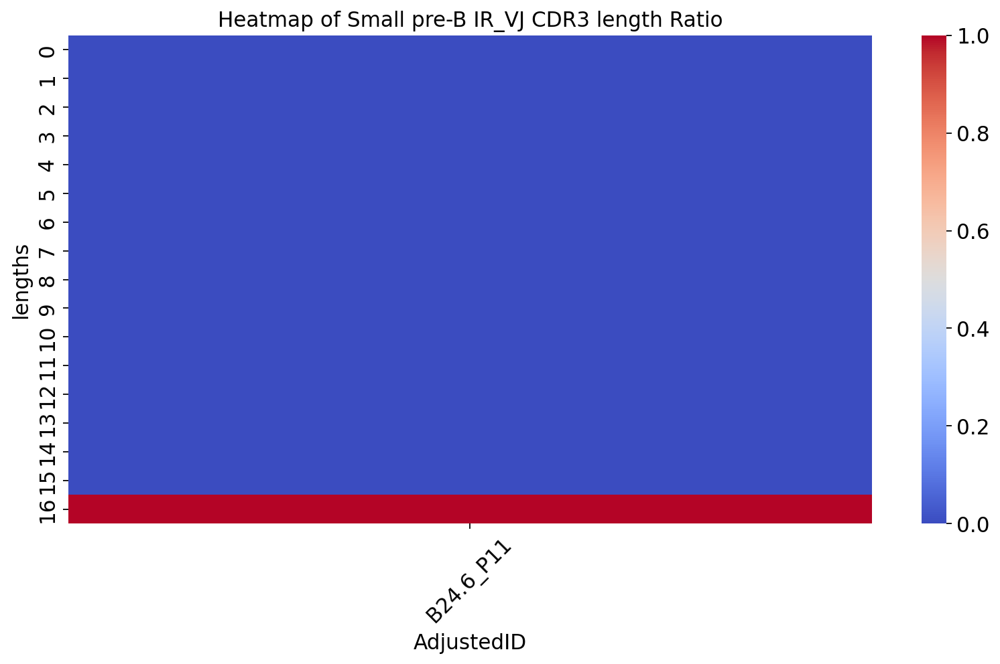

In [46]:

for cell_type in unique_cell_types:
    cellratio=BCR_plot_heatmap_cell_type(adataPBMC, cell_type,col='IR_VDJ_1_junction_aa')
    cellratio.to_csv('/data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/BCR_Figure/BCRdata/IGH/PBMC_IGH_'+cell_type+'_ratio.csv')

In [47]:
mkdir -p /data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/BCR_Figure/BCRdata/IGH/

[1] "PBMC_IGH_CXCR5- Naïve B_ratio.csv"
[1] "PBMC_IGH_CXCR5+ Naïve B_ratio.csv"
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'


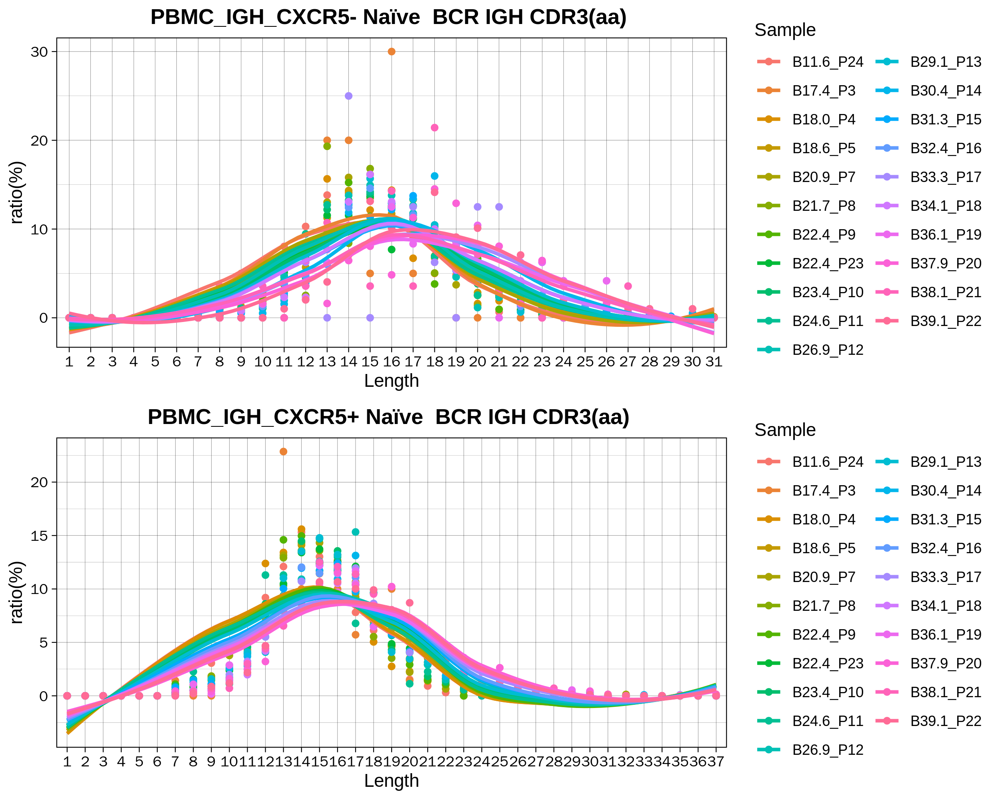

In [48]:
%%R -w 2500 -h 2000 -r 300 
dir('/data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/BCR_Figure/BCRdata/IGH/')
library(tidyverse)
library(reshape2)
library(gridExtra)
plot_PBMC_sum_ratio_celltype <- function(PBMC_dataBCR, plot_title = 'BCR IGH CDR3(aa) in PBMC') {

  PBMC_sum_ratio <- melt(PBMC_dataBCR, id = c("lengths"))
  PBMC_sum_ratio$lengths <- factor(PBMC_sum_ratio$lengths, level = unique(PBMC_sum_ratio$lengths))

  colnames(PBMC_sum_ratio) <- c('Length', 'Sample', 'ratio')
  PBMC_sum_ratio$ratio <- PBMC_sum_ratio$ratio * 100
  
  p <- ggplot(PBMC_sum_ratio) +
    geom_point(aes(Length, ratio, color = Sample)) +
    geom_smooth(aes(as.numeric(as.character(Length)), as.numeric(as.character(ratio)), color = Sample),se=F) +
    ggtitle(plot_title) +
    theme_linedraw() +
    xlab('Length') +
    ylab('ratio(%)') +
    theme(plot.title = element_text(hjust = 0.5, size = 13, face = "bold"))
  
  return(p)
}

plot_list <- list()
paths='/data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/BCR_Figure/BCRdata/IGH/'
for (i in c('PBMC_IGH_CXCR5- Naïve B_ratio.csv','PBMC_IGH_CXCR5+ Naïve B_ratio.csv')){
  print(i)
  name=gsub('B_ratio.csv','',i)
  BCRdata=read.csv(paste0(paths,i))
  BCRdata<-BCRdata[rowSums(BCRdata)>0,]
  

  plot_list[[i]] <- plot_PBMC_sum_ratio_celltype(BCRdata, plot_title =paste0(name,' BCR IGH CDR3(aa) '))
}


grid.arrange(grobs = plot_list, ncol = 1)  


In [49]:
%%R
source('/home/maolp/mao/Codeman/Project/Main_Gao_ScanpyProject/Mainrun.R')


In [50]:
!mkdir -p /home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Sup_Figure5/S32

[1] "PBMC_IGH_CXCR5- Naïve B_ratio.csv"
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
[1] "PBMC_IGH_CXCR5+ Naïve B_ratio.csv"
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
[1] "PBMC_IGH_Small pre-B_ratio.csv"
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'


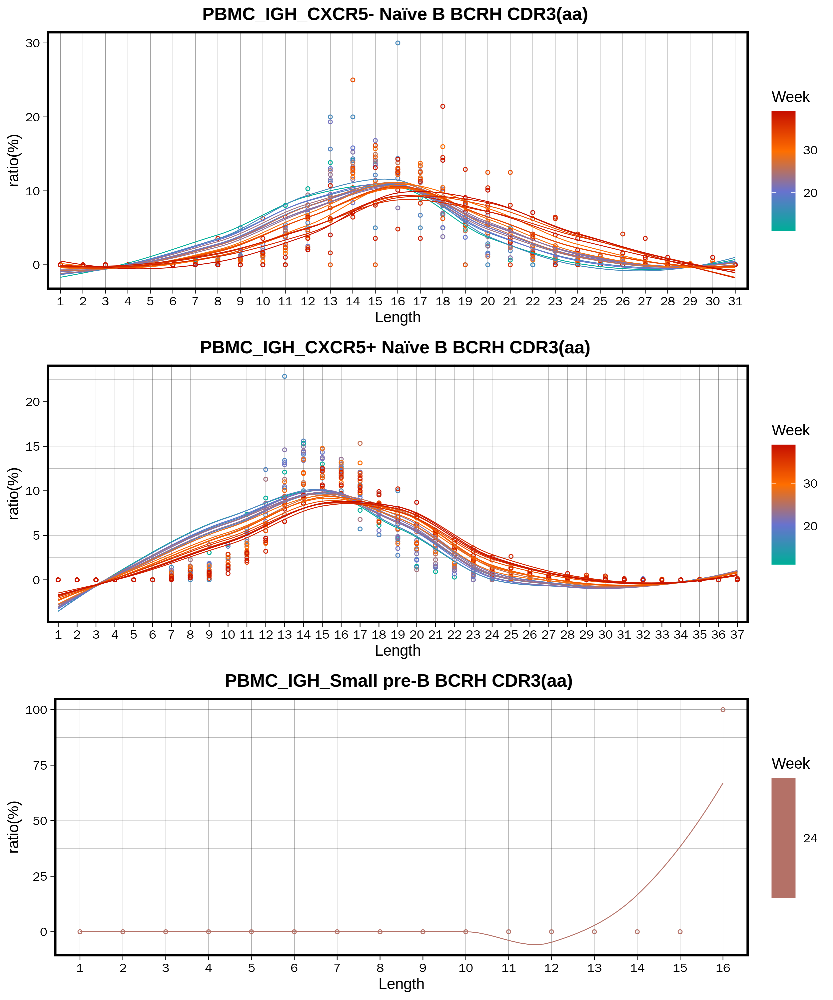

In [51]:
%%R -w 2500 -h 3000 -r 300 
paths='/data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/BCR_Figure/BCRdata/IGH/'
BCRHplot_list=list()
for (i in dir(paths)){
  print(i)
  name=gsub('_ratio.csv','',i)
  BCRHdata=read.csv(paste0(paths,i))
  BCRHdata<-BCRHdata[rowSums(BCRHdata)>0,]
  

  BCRHplot_list[[i]] <- plot_PBMC_sum_ratio_celltype(BCRHdata, plot_title =paste0(name,' BCRH CDR3(aa) '))+
    scale_color_gradientn(colours = rev(colorRampPalette(c("#C71000B2","#FF6F00B2","#6a73cf","#00AF99" ))(100)))
}
BCRHplotall=grid.arrange(grobs = BCRHplot_list, ncol = 1)  
ggsave(plot =BCRHplotall, filename ='/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Sup_Figure5/S32/S32_BCRHplotall.pdf', width = 7, height = 12)

[1] "PBMC_IGH_CXCR5- Naïve B_ratio.csv"
[1] "PBMC_IGH_CXCR5+ Naïve B_ratio.csv"


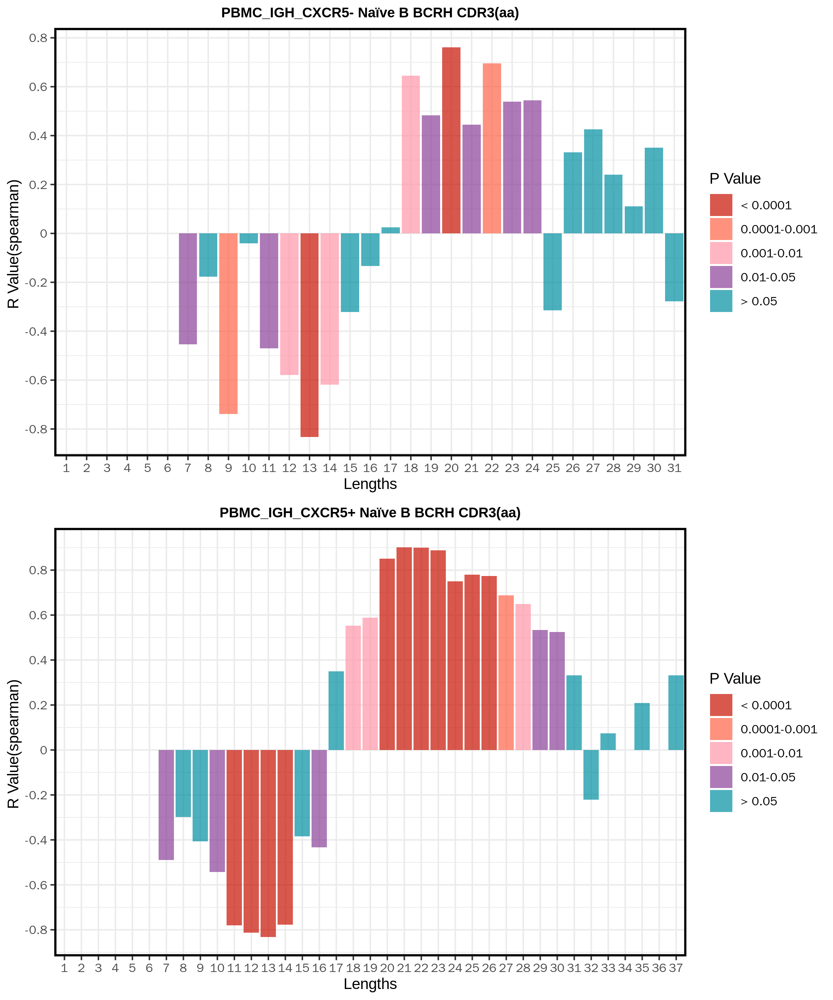

In [52]:
%%R -w 2500 -h 3000 -r 300 
dir('/data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/BCR_Figure/BCRdata/IGH/')
library(tidyverse)
library(reshape2)
library(gridExtra)
BCRHplot_pvalue <- list()
paths='/data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/BCR_Figure/BCRdata/IGH/'

Adatalist=c('PBMC_IGH_CXCR5- Naïve B_ratio.csv','PBMC_IGH_CXCR5+ Naïve B_ratio.csv')
plot_list=list()
for (i in Adatalist){
  print(i)
  name=gsub('_ratio.csv','',i)
  BCRdata=read.csv(paste0(paths,i))
  BCRdata<-BCRdata[rowSums(BCRdata)>0,]
#   print(head(plot_Cell_sum_ratio_celltype(BCRdata)))
  
  BCRHtem <- plot_Cell_sum_ratio_celltype(BCRdata)
#   print(Dfcalculate_correlation(BCRHtem , "lengths", "week", "proportion"))
  BCRHtem2 <- Dfcalculate_correlation(BCRHtem , "lengths", "week", "proportion")

  BCRHtem3 <- create_pval_plot(BCRHtem2,paste0(name,' IGH'))  
#   print(BCRHtem3)
 BCRHplot_pvalue[[i]] <- create_pval_plot(BCRHtem2,paste0(name,' BCRH CDR3(aa)'))  
}

Hplot_pvalue=grid.arrange(grobs =BCRHplot_pvalue, ncol = 1)  
ggsave(plot =Hplot_pvalue, filename ='/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Sup_Figure5/S32/S32_BCRHpvalue.pdf', width = 7, height = 7)

In [53]:
!mkdir -p /data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/BCR_Figure/BCRdata/IGL/

In [54]:
# !mkdir -p /data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/BCR_Figure/BCRdata/IGL/
!rm -rf /data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/BCR_Figure/BCRdata/IGL/*IGKC*

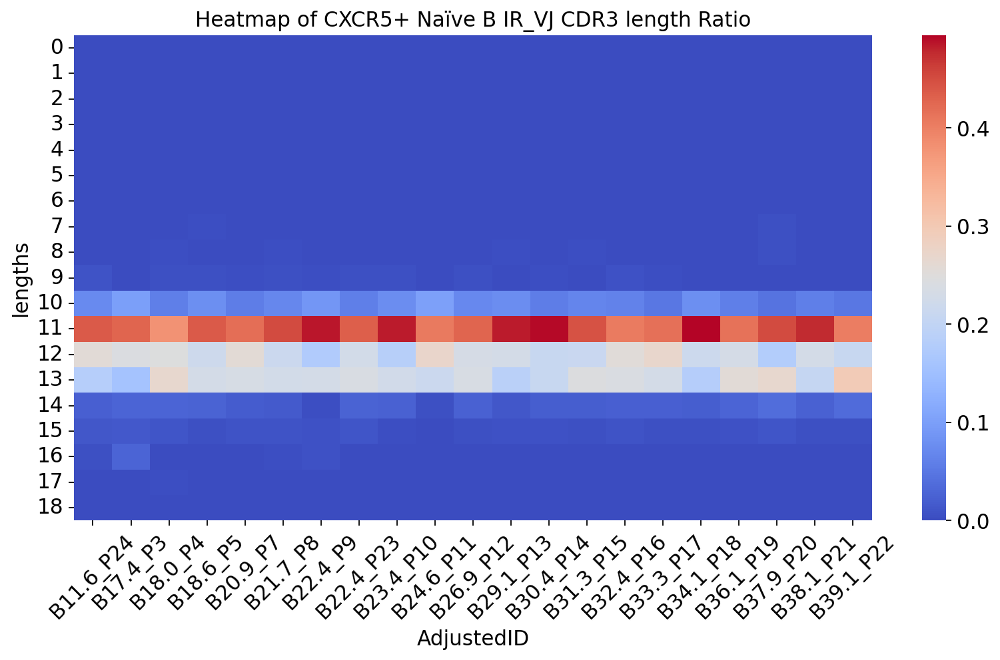

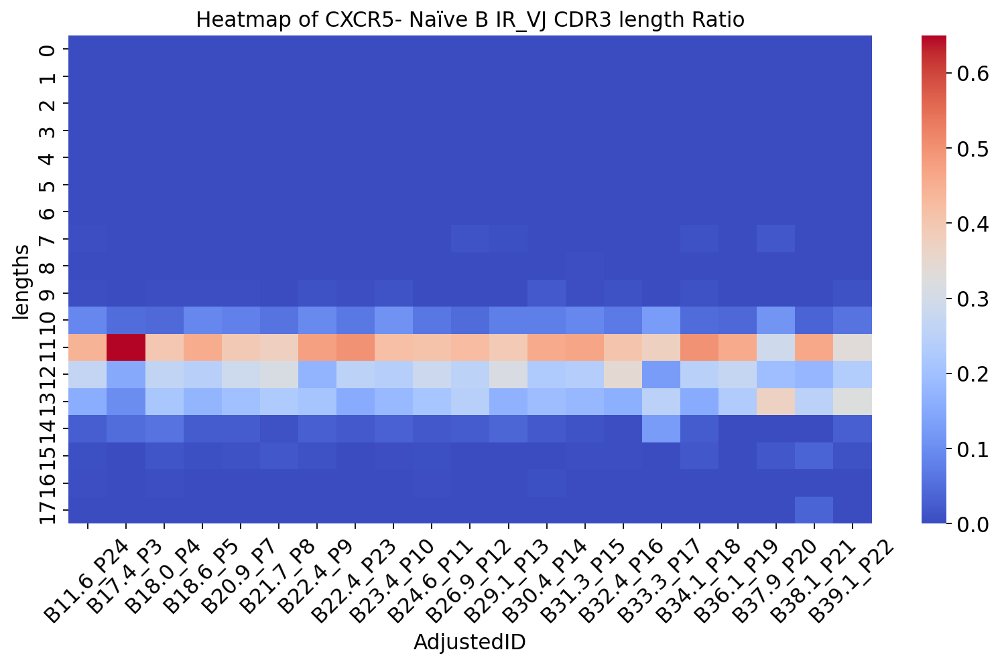

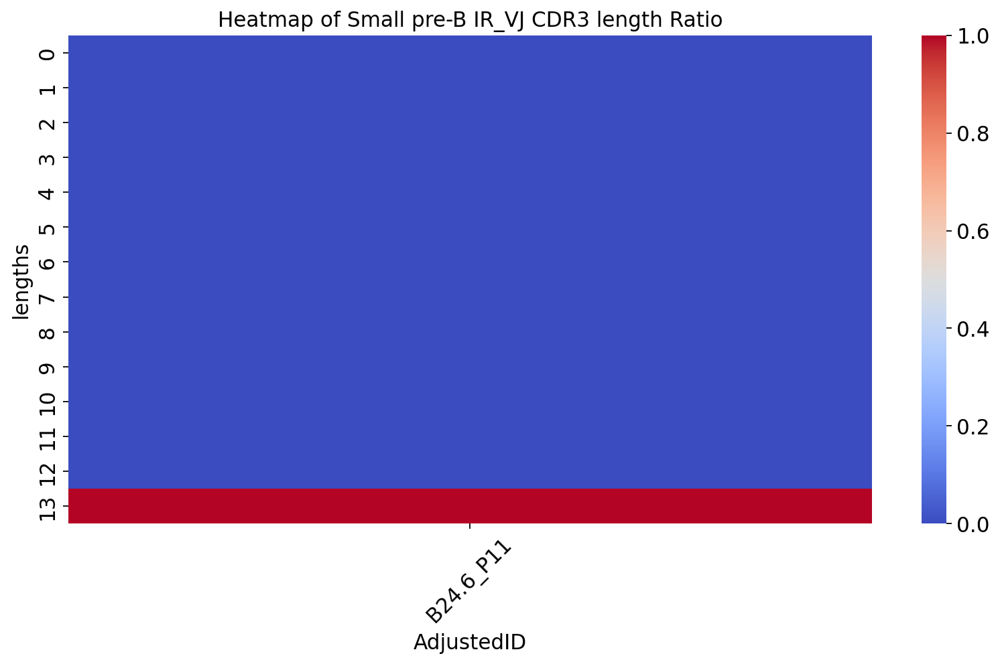

In [55]:
import anndata
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scirpy as ir

# def BCR_All_plot_heatmap(adata,col='IR_VDJ_1_junction_aa',title='BCR all',groupSample="AdjustedID"):
#     filtered_adata=adata
#     df = ir.tl.spectratype(filtered_adata, target_col=groupSample,groupby=col)

def BCR_plot_heatmap_cell_type(adata, cell_type,groupcell='Last_cell_type',col='IR_VDJ_1_junction_aa',title='BCR all',groupSample="AdjustedID"):
    filtered_adata = adata[adata.obs[groupcell] == cell_type]
    df = ir.tl.spectratype(filtered_adata, target_col=groupSample,groupby=col)

    df_sums = df.sum(axis=0)
    df_sums_ratio = df.div(df_sums, axis=1)

    plt.figure(figsize=(12, 6))
    sns.heatmap(df_sums_ratio, xticklabels=True, cmap='coolwarm')
    plt.title(f'Heatmap of {cell_type} IR_VJ CDR3 length Ratio')
    plt.xticks(rotation=45)  # 旋转x轴标签，使其更易读
    plt.show()
    return df_sums_ratio

unique_cell_types =  ['CXCR5+ Naïve B', 'CXCR5- Naïve B', 'Small pre-B']

# for cell_type in unique_cell_types:
#     BCR_plot_heatmap(adataPBMC, cell_type)

for cell_type in unique_cell_types:
    cellratio=BCR_plot_heatmap_cell_type(adataPBMC, cell_type,col='IR_VJ_1_junction_aa')
    cellratio.to_csv('/data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/BCR_Figure/BCRdata/IGL/PBMC_'+cell_type+'_ratio.csv')

[1] "PBMC_CXCR5- Naïve B_ratio.csv"
[1] "PBMC_CXCR5+ Naïve B_ratio.csv"


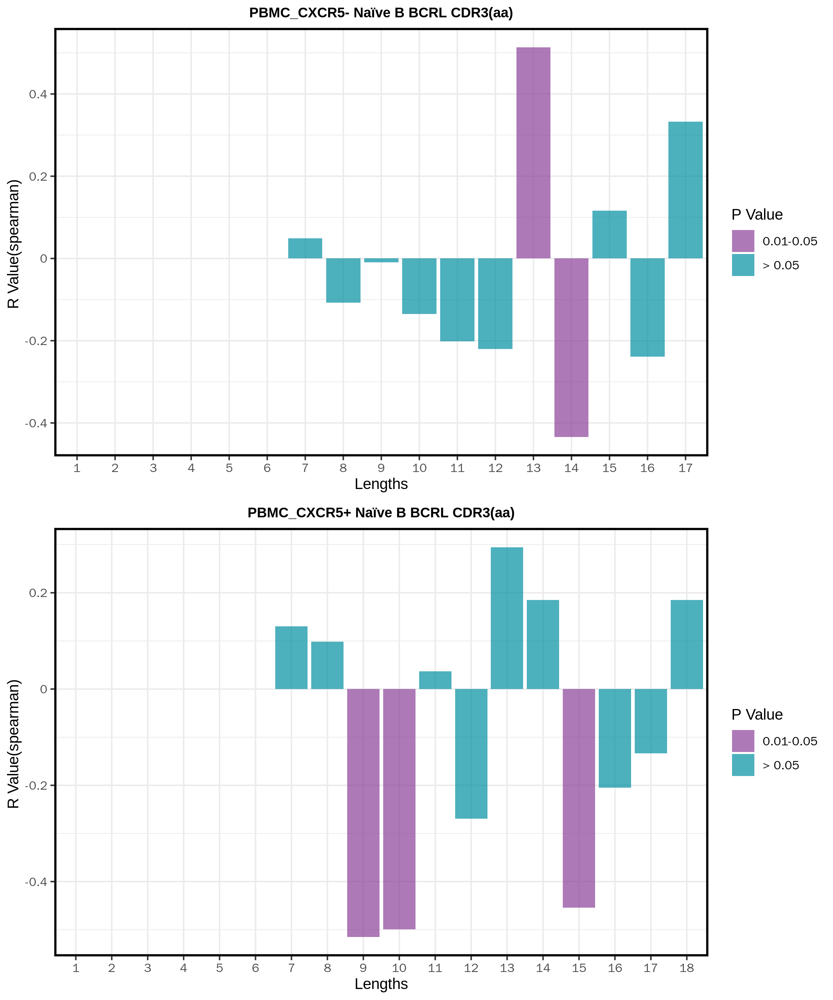

In [56]:
%%R -w 2500 -h 3000 -r 300 
dir('/data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/BCR_Figure/BCRdata/IGL/')
library(tidyverse)
library(reshape2)
library(gridExtra)
BCRLplot_pvalue <- list()
paths='/data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/BCR_Figure/BCRdata/IGL/'

Adatalist=c("PBMC_CXCR5- Naïve B_ratio.csv" , "PBMC_CXCR5+ Naïve B_ratio.csv")
plot_list=list()
for (i in Adatalist){
  print(i)
  name=gsub('_ratio.csv','',i)
  BCRdata=read.csv(paste0(paths,i))
  BCRdata<-BCRdata[rowSums(BCRdata)>0,]
#   print(head(plot_Cell_sum_ratio_celltype(BCRdata)))
  
  BCRLtem <- plot_Cell_sum_ratio_celltype(BCRdata)
#   print(Dfcalculate_correlation(BCRLtem , "lengths", "week", "proportion"))
  BCRLtem2 <- Dfcalculate_correlation(BCRLtem , "lengths", "week", "proportion")

  BCRLtem3 <- create_pval_plot(BCRLtem2,paste0(name,' IGL'))  
#   print(BCRLtem3)
 BCRLplot_pvalue[[i]] <- create_pval_plot(BCRLtem2,paste0(name,' BCRL CDR3(aa)'))  
}

grid.arrange(grobs =BCRLplot_pvalue, ncol = 1)  
Lplot_pvalue=grid.arrange(grobs =BCRLplot_pvalue, ncol = 1)  
ggsave(plot =Lplot_pvalue, filename ='/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Sup_Figure5/S32/S32_BCRLpvalue.pdf', width = 7, height = 7)

[1] "PBMC_CXCR5- Naïve B_ratio.csv"
[1] "PBMC_CXCR5+ Naïve B_ratio.csv"


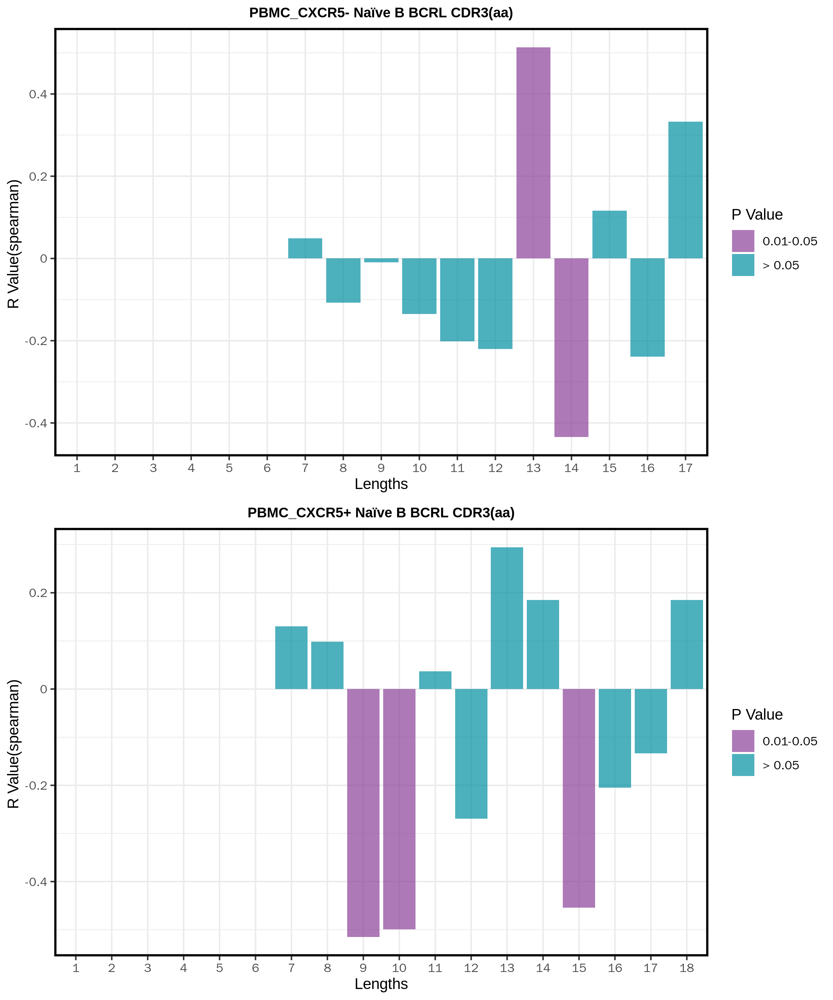

In [57]:
%%R -w 2500 -h 3000 -r 300 
dir('/data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/BCR_Figure/BCRdata/IGL/')
library(tidyverse)
library(reshape2)
library(gridExtra)
BCRLplot_pvalue <- list()
paths='/data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/BCR_Figure/BCRdata/IGL/'

Adatalist=c("PBMC_CXCR5- Naïve B_ratio.csv" , "PBMC_CXCR5+ Naïve B_ratio.csv")
plot_list=list()
for (i in Adatalist){
  print(i)
  name=gsub('_ratio.csv','',i)
  BCRdata=read.csv(paste0(paths,i))
  BCRdata<-BCRdata[rowSums(BCRdata)>0,]
#   print(head(plot_Cell_sum_ratio_celltype(BCRdata)))
  
  BCRLtem <- plot_Cell_sum_ratio_celltype(BCRdata)
#   print(Dfcalculate_correlation(BCRLtem , "lengths", "week", "proportion"))
  BCRLtem2 <- Dfcalculate_correlation(BCRLtem , "lengths", "week", "proportion")

  BCRLtem3 <- create_pval_plot(BCRLtem2,paste0(name,' IGL'))  
#   print(BCRLtem3)
 BCRLplot_pvalue[[i]] <- create_pval_plot(BCRLtem2,paste0(name,' BCRL CDR3(aa)'))  
}

grid.arrange(grobs =BCRLplot_pvalue, ncol = 1)  
ggsave(plot =Lplot_pvalue, filename ='/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Sup_Figure5/S32/S32_BCRLpvalue.pdf', width = 7, height = 7)

[1] "PBMC_CXCR5- Naïve B_ratio.csv"
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
[1] "PBMC_CXCR5+ Naïve B_ratio.csv"
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
[1] "PBMC_Small pre-B_ratio.csv"
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'


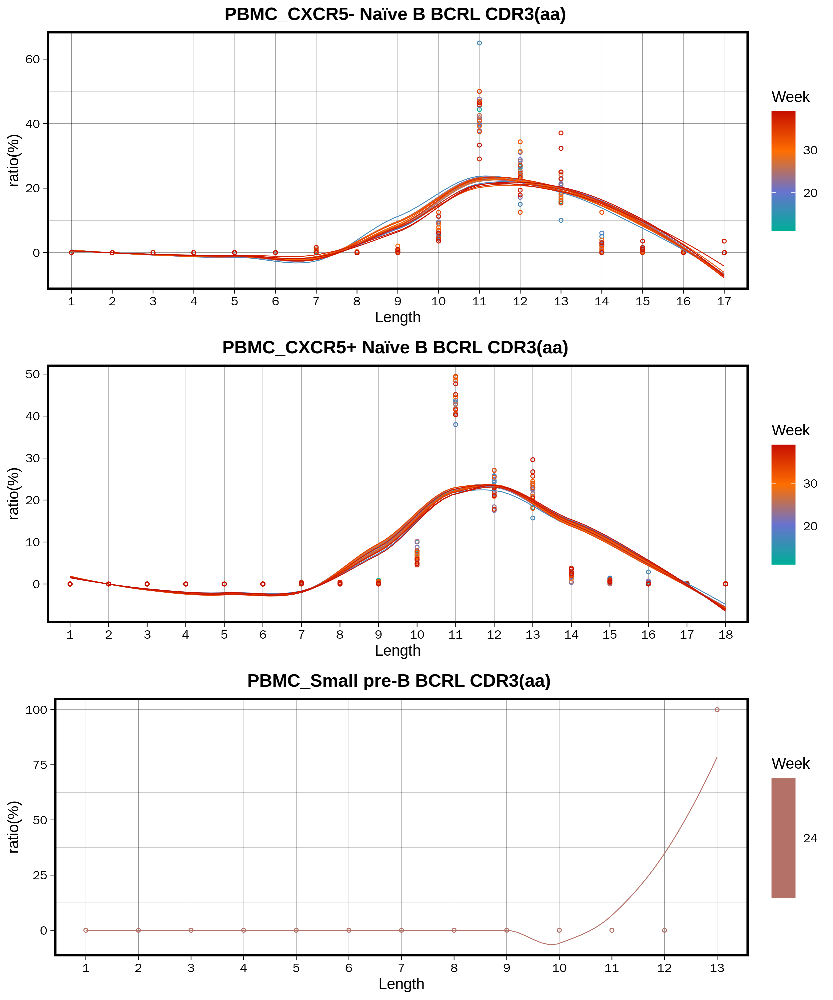

In [58]:
%%R -w 2500 -h 3000 -r 300 
paths='/data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/BCR_Figure/BCRdata/IGL/'
BCRLplot_list=list()
for (i in dir(paths)){
  print(i)
  name=gsub('_ratio.csv','',i)
  BCRLdata=read.csv(paste0(paths,i))
  BCRLdata<-BCRLdata[rowSums(BCRLdata)>0,]
  
  # 将每个绘制的图像存储在plot_list中
  BCRLplot_list[[i]] <- plot_PBMC_sum_ratio_celltype(BCRLdata, plot_title =paste0(name,' BCRL CDR3(aa) '))+
      scale_color_gradientn(colours = rev(colorRampPalette(c("#C71000B2","#FF6F00B2","#6a73cf","#00AF99" ))(100)))
}
Lplot_pvalue2=grid.arrange(grobs = BCRLplot_list, ncol = 1)  
ggsave(plot =Lplot_pvalue2, filename ='/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Sup_Figure5/S32/S32_BCRL.pdf', width = 7, height = 7)

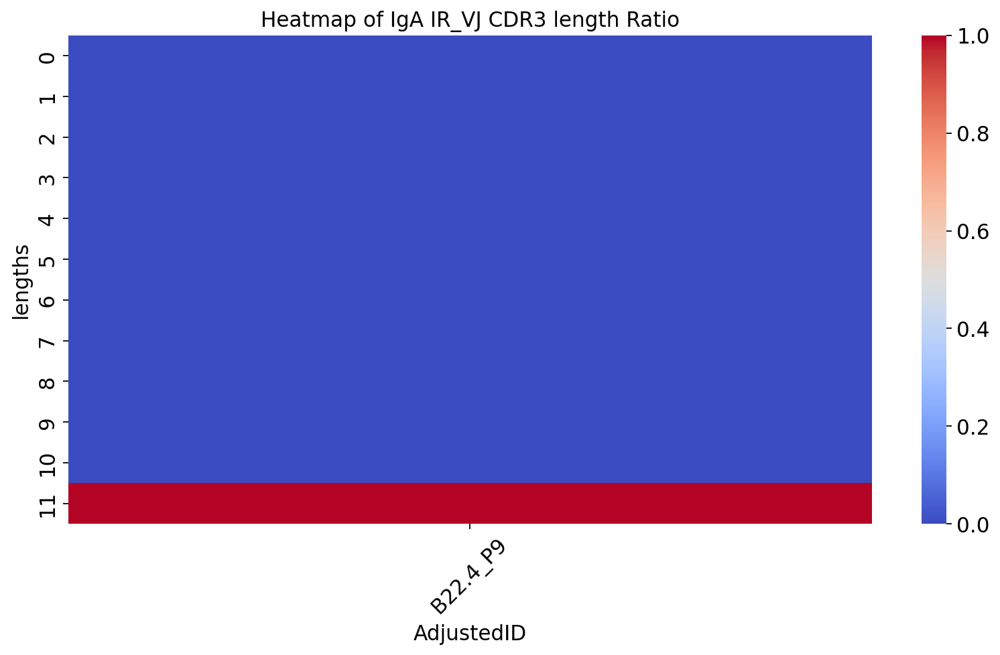

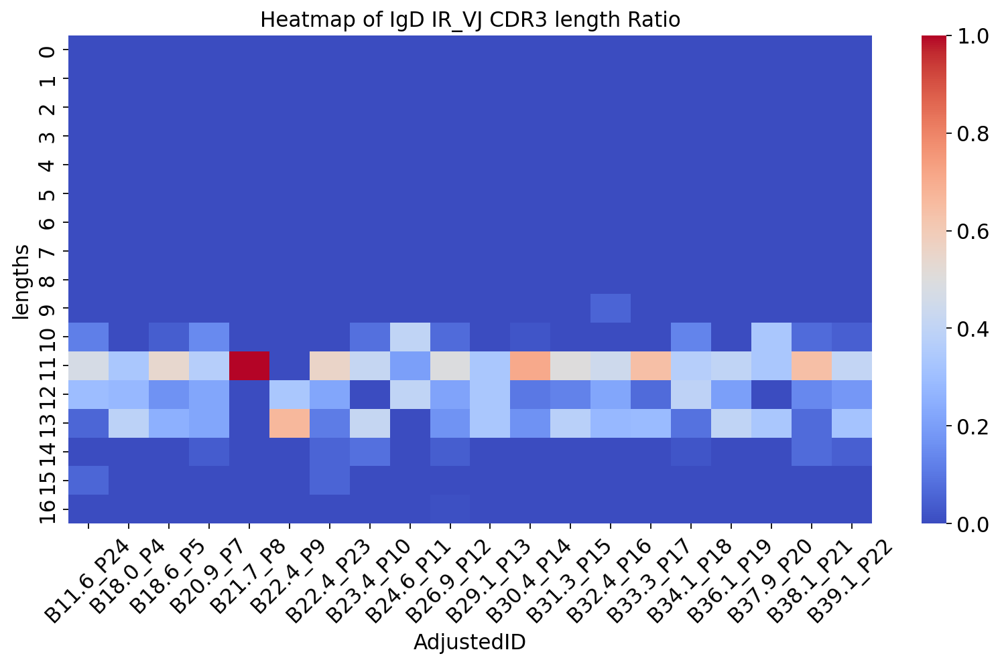

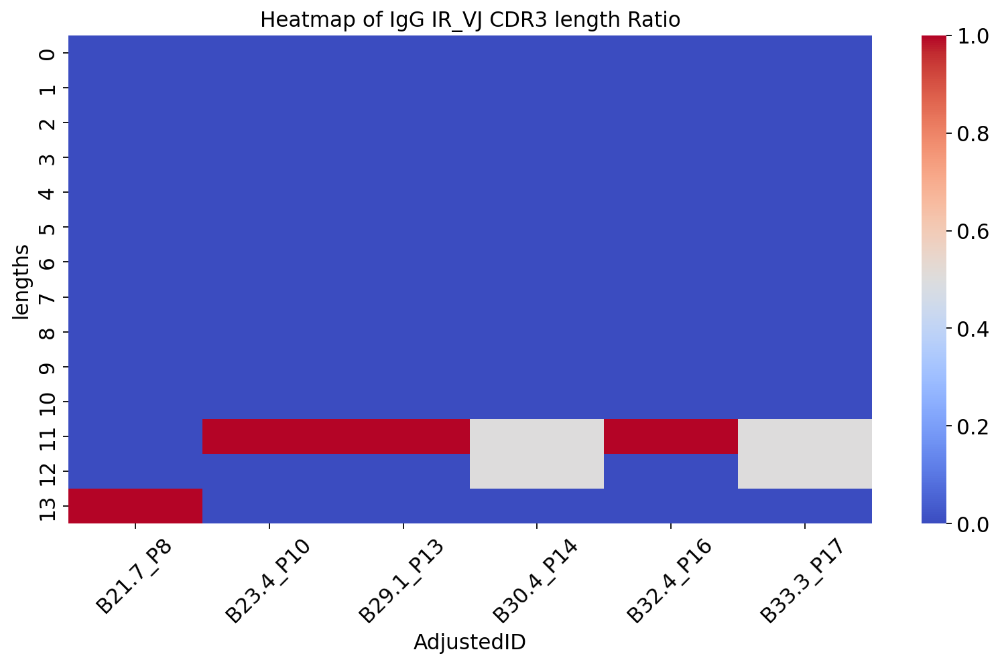

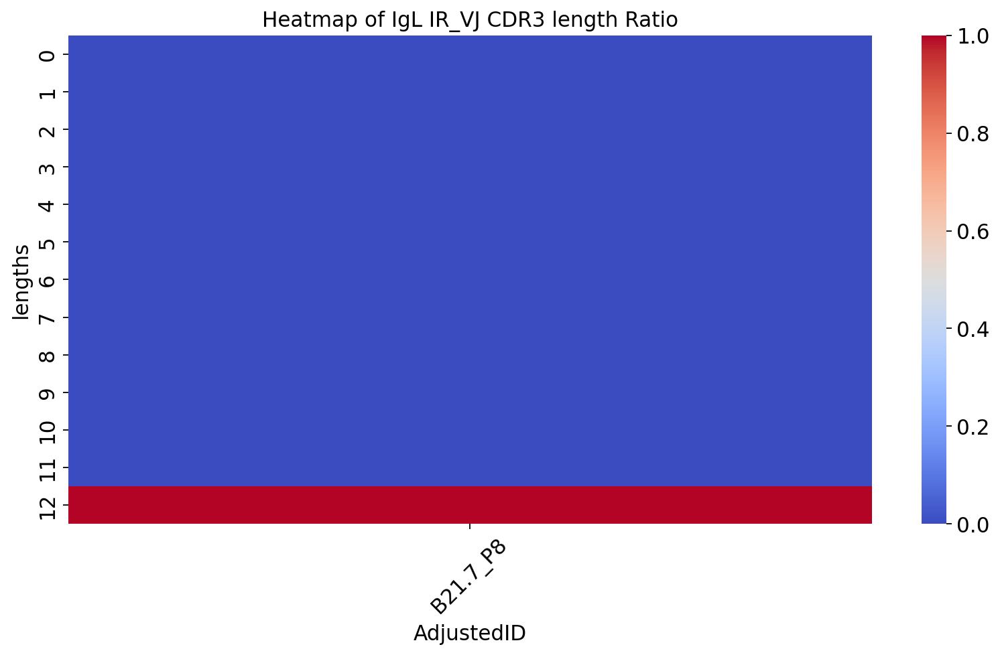

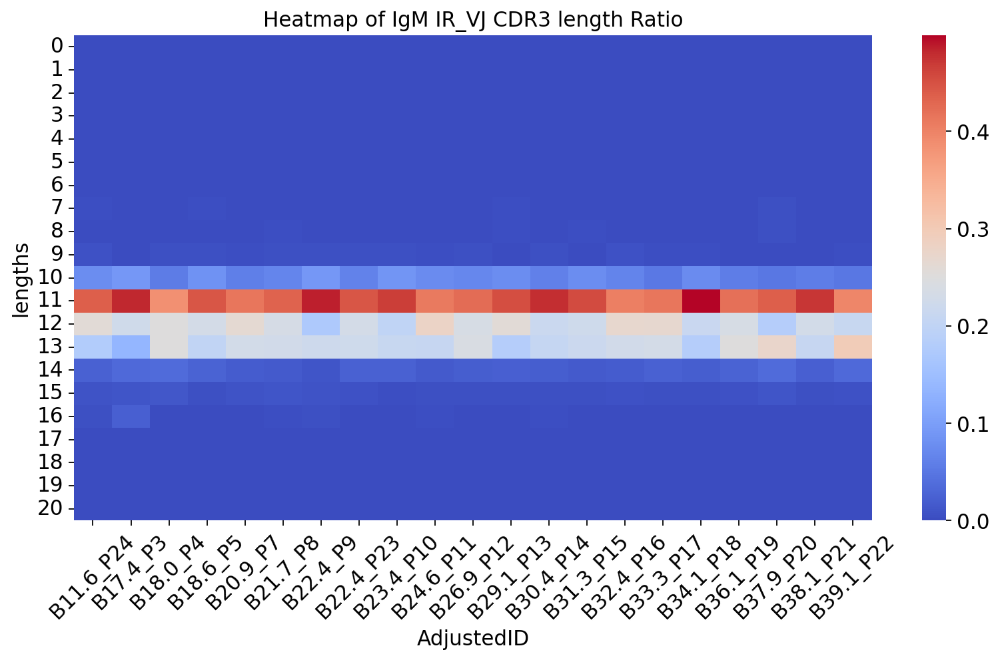

In [59]:
import anndata
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scirpy as ir

# def BCR_All_plot_heatmap(adata,col='IR_VDJ_1_junction_aa',title='BCR all',groupSample="AdjustedID"):
#     filtered_adata=adata
#     df = ir.tl.spectratype(filtered_adata, target_col=groupSample,groupby=col)

def BCR_plot_heatmap_cell_type(adata, cell_type,groupcell='Last_cell_type',col='IR_VDJ_1_junction_aa',title='BCR all',groupSample="AdjustedID"):
    filtered_adata = adata[adata.obs[groupcell] == cell_type]
    df = ir.tl.spectratype(filtered_adata, target_col=groupSample,groupby=col)

    df_sums = df.sum(axis=0)
    df_sums_ratio = df.div(df_sums, axis=1)

    plt.figure(figsize=(12, 6))
    sns.heatmap(df_sums_ratio, xticklabels=True, cmap='coolwarm')
    plt.title(f'Heatmap of {cell_type} IR_VJ CDR3 length Ratio')
    plt.xticks(rotation=45)  
    plt.show()
    return df_sums_ratio

unique_cell_types = ['IgA', 'IgD', 'IgG', 'IgL', 'IgM']

# for cell_type in unique_cell_types:
#     BCR_plot_heatmap(adataPBMC, cell_type)

for cell_type in unique_cell_types:
    cellratio=BCR_plot_heatmap_cell_type(adataPBMC, cell_type,groupcell='isotype_status',col='IR_VJ_1_junction_aa')
    cellratio.to_csv('/data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/BCR_Figure/BCRISOdataIGL/PBMC_'+cell_type+'_ratio.csv')

[1] "PBMC_IgA_ratio.csv"
[1] "PBMC_IgG_ratio.csv"
[1] "PBMC_IgD_ratio.csv"
[1] "PBMC_IgL_ratio.csv"
[1] "PBMC_IgM_ratio.csv"
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'


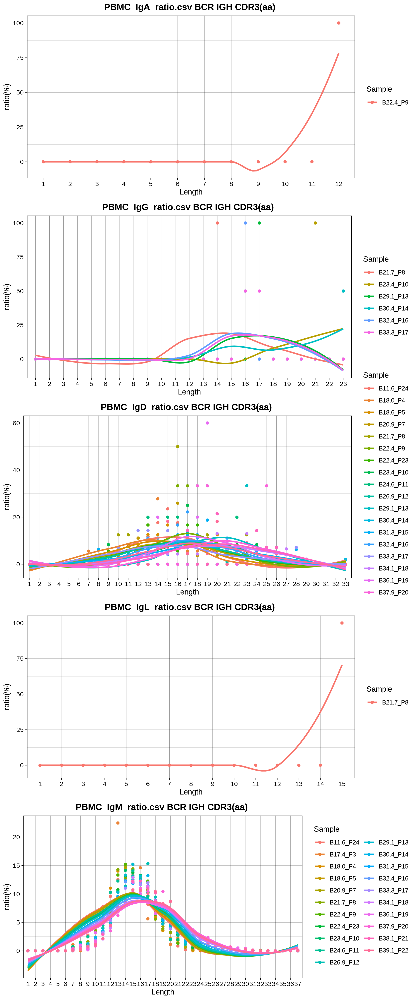

In [60]:
%%R -w 2500 -h 6000 -r 300 
# dir('/data5/maolp/Gaofeng_All_matrix/Allcount/Last_All_scanpyData/BCR_Figure/BCRdata/IGH/')
library(tidyverse)
library(reshape2)
library(gridExtra)
plot_PBMC_sum_ratio_celltype <- function(PBMC_dataBCR, plot_title = 'BCR IGH CDR3(aa) in PBMC') {

  PBMC_sum_ratio <- melt(PBMC_dataBCR, id = c("lengths"))
  PBMC_sum_ratio$lengths <- factor(PBMC_sum_ratio$lengths, level = unique(PBMC_sum_ratio$lengths))

  colnames(PBMC_sum_ratio) <- c('Length', 'Sample', 'ratio')
  PBMC_sum_ratio$ratio <- PBMC_sum_ratio$ratio * 100
  
  p <- ggplot(PBMC_sum_ratio) +
    geom_point(aes(Length, ratio, color = Sample)) +
    geom_smooth(aes(as.numeric(as.character(Length)), as.numeric(as.character(ratio)), color = Sample),se=F) +
    ggtitle(plot_title) +
    theme_linedraw() +
    xlab('Length') +
    ylab('ratio(%)') +
    theme(plot.title = element_text(hjust = 0.5, size = 13, face = "bold"))
  
  return(p)
}

plot_list <- list()
paths='/data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/BCR_Figure/BCRISOdata/'
for (i in c('PBMC_IgA_ratio.csv',  'PBMC_IgG_ratio.csv', 
'PBMC_IgD_ratio.csv',  'PBMC_IgL_ratio.csv',  'PBMC_IgM_ratio.csv')){
  print(i)
  name=gsub('B_ratio.csv','',i)
  BCRdata=read.csv(paste0(paths,i))
  BCRdata<-BCRdata[rowSums(BCRdata)>0,]
  

  plot_list[[i]] <- plot_PBMC_sum_ratio_celltype(BCRdata, plot_title =paste0(name,' BCR IGH CDR3(aa) '))
}


grid.arrange(grobs = plot_list, ncol = 1)  

In [61]:
mkdir -p /home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Sup_Figure5/S5new

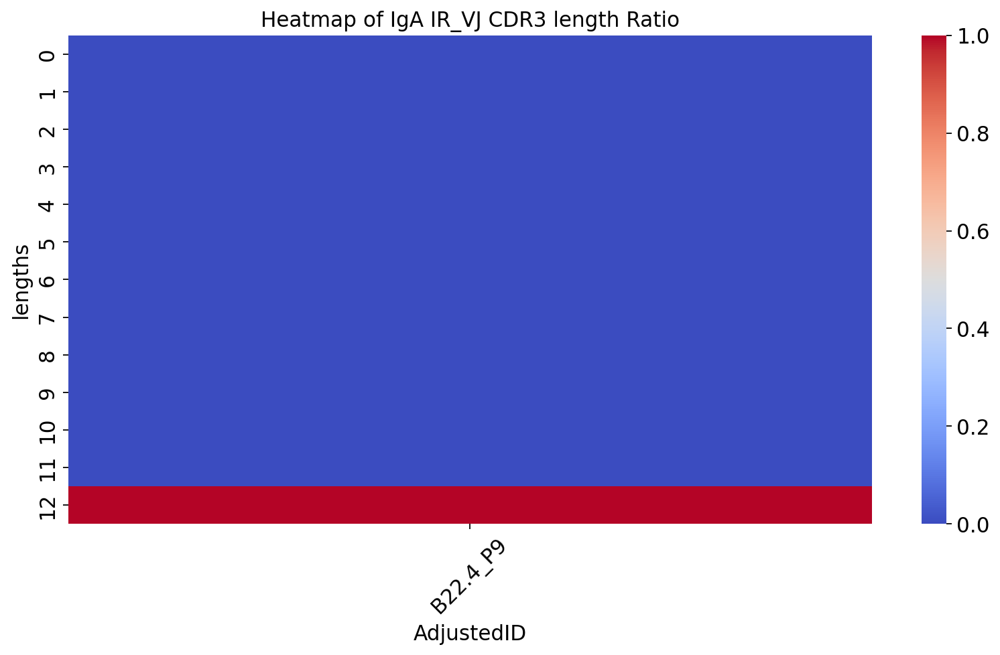

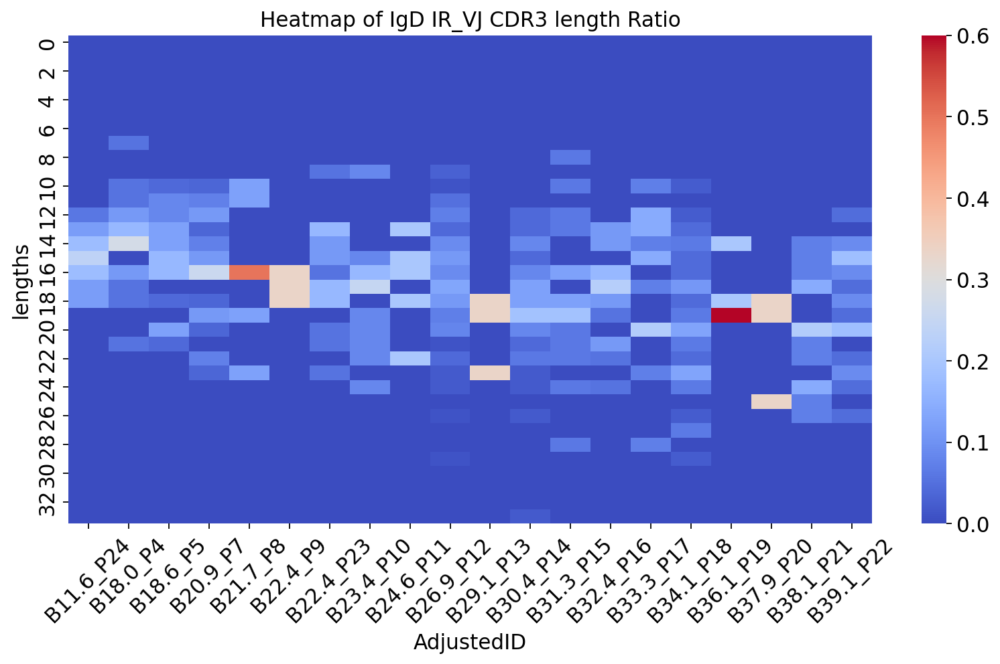

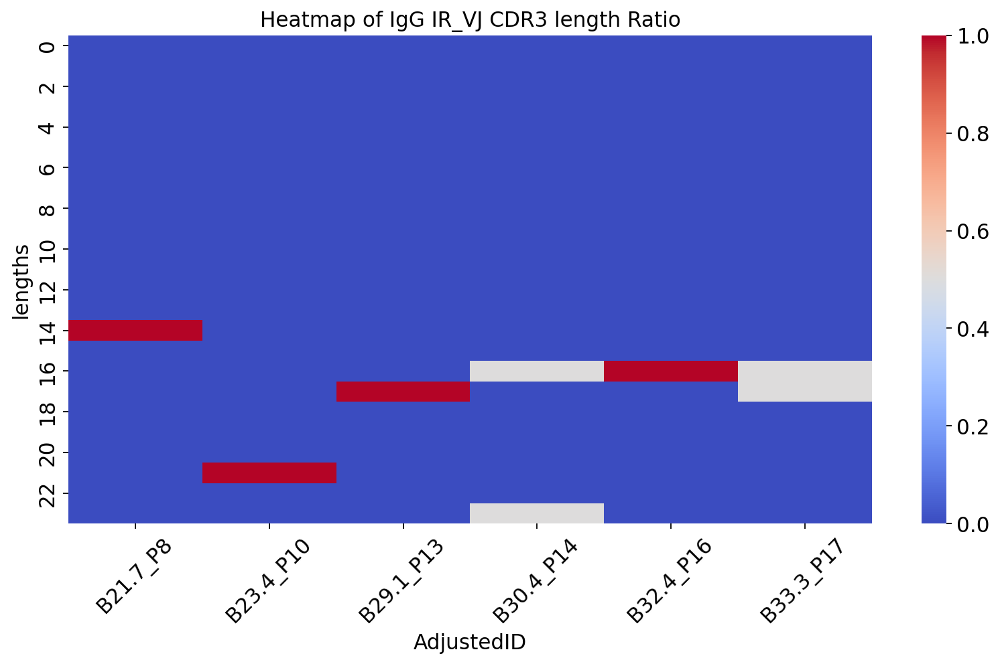

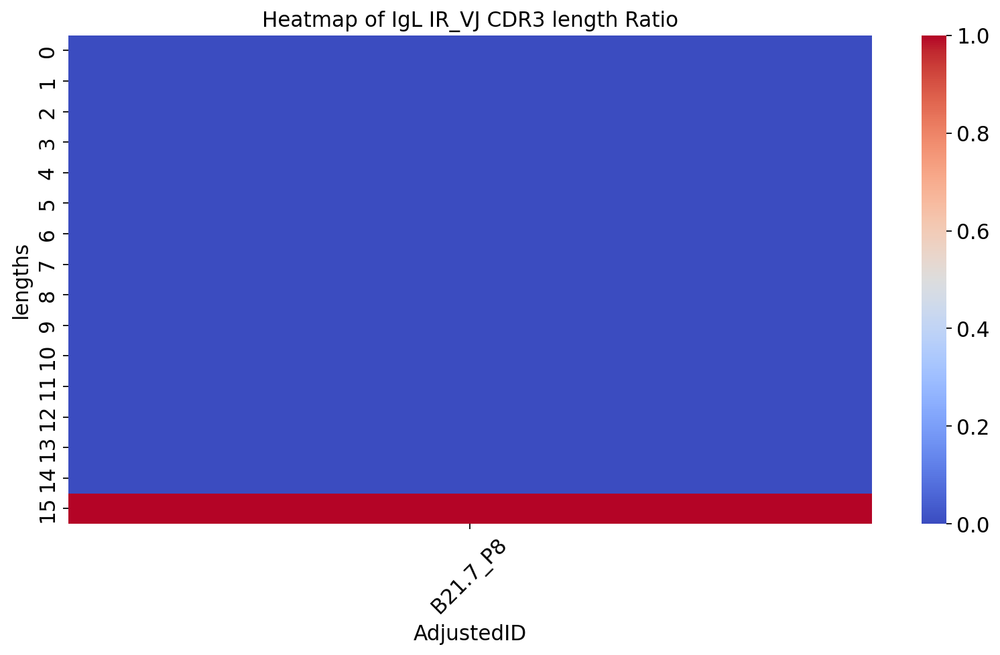

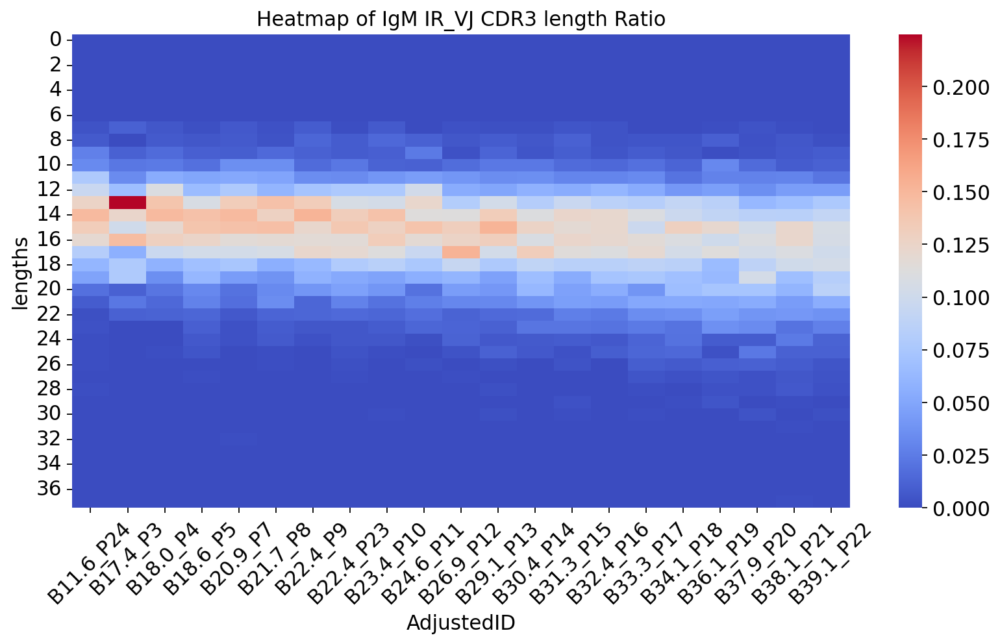

In [62]:
import anndata
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scirpy as ir

# def BCR_All_plot_heatmap(adata,col='IR_VDJ_1_junction_aa',title='BCR all',groupSample="AdjustedID"):
#     filtered_adata=adata
#     df = ir.tl.spectratype(filtered_adata, target_col=groupSample,groupby=col)

def BCR_plot_heatmap_cell_type(adata, cell_type,groupcell='Last_cell_type',col='IR_VDJ_1_junction_aa',title='BCR all',groupSample="AdjustedID"):
    filtered_adata = adata[adata.obs[groupcell] == cell_type]
    df = ir.tl.spectratype(filtered_adata, target_col=groupSample,groupby=col)

    df_sums = df.sum(axis=0)
    df_sums_ratio = df.div(df_sums, axis=1)

    plt.figure(figsize=(12, 6))
    sns.heatmap(df_sums_ratio, xticklabels=True, cmap='coolwarm')
    plt.title(f'Heatmap of {cell_type} IR_VJ CDR3 length Ratio')
    plt.xticks(rotation=45)  
    plt.show()
    return df_sums_ratio

unique_cell_types = ['IgA', 'IgD', 'IgG', 'IgL', 'IgM']

# for cell_type in unique_cell_types:
#     BCR_plot_heatmap(adataPBMC, cell_type)

for cell_type in unique_cell_types:
    cellratio=BCR_plot_heatmap_cell_type(adataPBMC, cell_type,groupcell='isotype_status',col='IR_VDJ_1_junction_aa')
    cellratio.to_csv('/data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/BCR_Figure/BCRISOdata/PBMC_'+cell_type+'_ratio.csv')

In [63]:
%%R
source('/home/maolp/mao/Codeman/Project/Main_Gao_ScanpyProject/Mainrun.R')


[1] "PBMC_IgD_ratio.csv"
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
[1] "PBMC_IgM_ratio.csv"
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'


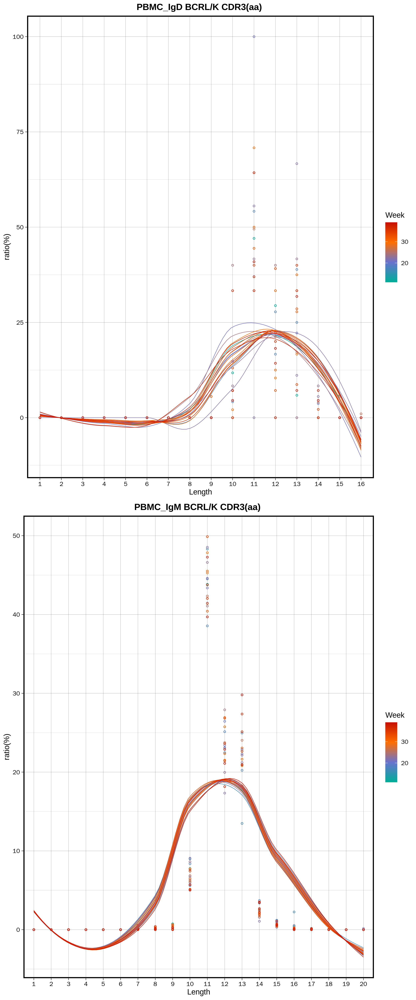

In [64]:
%%R -w 2500 -h 6000 -r 300 
library(RColorBrewer )
paths='/data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/BCR_Figure/BCRISOdataIGL/'
BCRHplot_list=list()
for (i in c(
'PBMC_IgD_ratio.csv',  'PBMC_IgM_ratio.csv')){
  print(i)
  name=gsub('_ratio.csv','',i)
  BCRHdata=read.csv(paste0(paths,i))
  BCRHdata<-BCRHdata[rowSums(BCRHdata)>0,]
  
  # 将每个绘制的图像存储在plot_list中
  BCRHplot_list[[i]] <- plot_PBMC_sum_ratio_celltype(BCRHdata, plot_title =paste0(name,' BCRL/K CDR3(aa) '))+
    scale_color_gradientn(colours = rev(colorRampPalette(c("#C71000B2","#FF6F00B2","#6a73cf","#00AF99" ))(100)))
}
P9=grid.arrange(grobs = BCRHplot_list, ncol = 1) 
ggsave(plot=P9,"/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Sup_Figure5/S5new/IGLsmooth.pdf",height=8,width=8)

[1] "PBMC_IgD_ratio.csv"
[1] "PBMC_IgM_ratio.csv"
Saving 8.33 x 10 in image


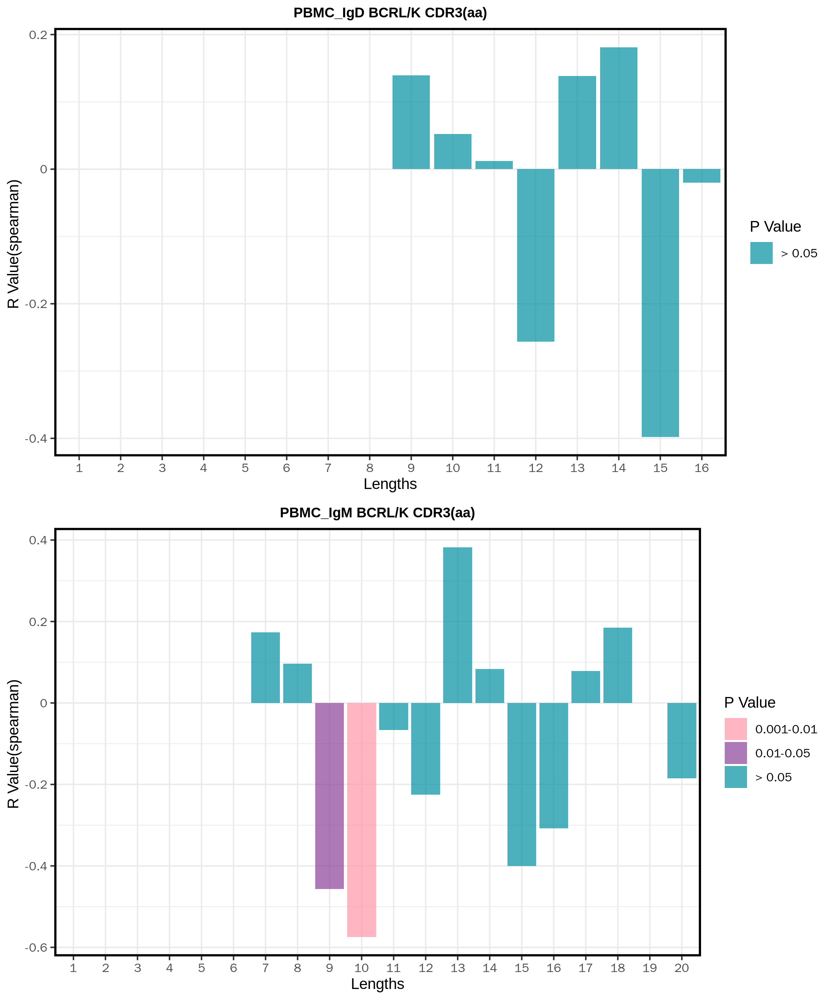

In [65]:
%%R -w 2500 -h 3000 -r 300 
# dir('/data5/maolp/Gaofeng_All_matrix/Allcount/Last_All_scanpyData/BCR_Figure/BCRdata/IGH/')
library(tidyverse)
library(reshape2)
library(gridExtra)
BCRHplot_pvalue <- list()
paths='/data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/BCR_Figure/BCRISOdataIGL/'

Adatalist=c('PBMC_IgD_ratio.csv', 'PBMC_IgM_ratio.csv')
plot_list=list()
for (i in Adatalist){
  print(i)
  name=gsub('_ratio.csv','',i)
  BCRdata=read.csv(paste0(paths,i))
  BCRdata<-BCRdata[rowSums(BCRdata)>0,]
#   print(head(plot_Cell_sum_ratio_celltype(BCRdata)))
  
  BCRHtem <- plot_Cell_sum_ratio_celltype(BCRdata)
#   print(Dfcalculate_correlation(BCRHtem , "lengths", "week", "proportion"))
  BCRHtem2 <- Dfcalculate_correlation(BCRHtem , "lengths", "week", "proportion")

  BCRHtem3 <- create_pval_plot(BCRHtem2,paste0(name,' IGH'))  
#   print(BCRHtem3)
 BCRHplot_pvalue[[i]] <- create_pval_plot(BCRHtem2,paste0(name,' BCRL/K CDR3(aa)'))  
}

P10=grid.arrange(grobs =BCRHplot_pvalue, ncol = 1)  
ggsave(plot=P10,"/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Sup_Figure5/S5new/IGLpvalue.pdf")

[1] "PBMC_IgA_ratio.csv"
[1] "PBMC_IgG_ratio.csv"
[1] "PBMC_IgM-IgD_ratio.csv"
[1] "PBMC_IgD_ratio.csv"
[1] "PBMC_IgL_ratio.csv"
[1] "PBMC_IgM_ratio.csv"
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'


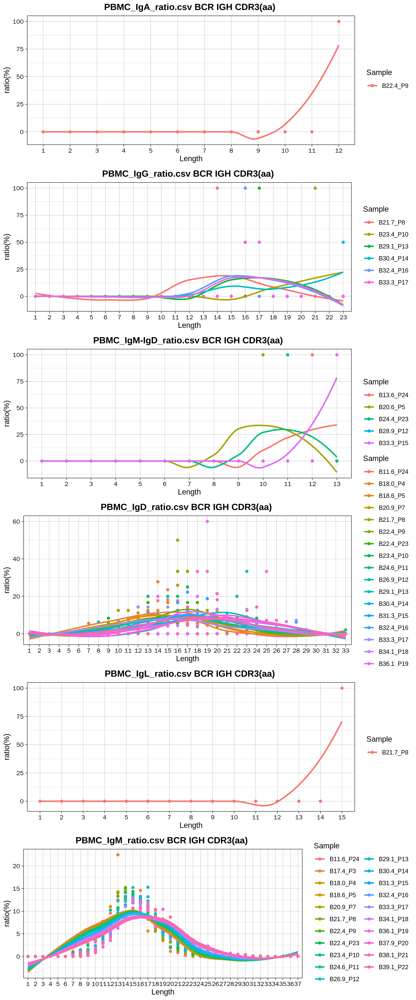

In [66]:
%%R -w 2500 -h 6000 -r 300 
# dir('/data5/maolp/Gaofeng_All_matrix/Allcount/Last_All_scanpyData/BCR_Figure/BCRdata/IGH/')
library(tidyverse)
library(reshape2)
library(gridExtra)
plot_PBMC_sum_ratio_celltype <- function(PBMC_dataBCR, plot_title = 'BCR IGH CDR3(aa) in PBMC') {

  PBMC_sum_ratio <- melt(PBMC_dataBCR, id = c("lengths"))
  PBMC_sum_ratio$lengths <- factor(PBMC_sum_ratio$lengths, level = unique(PBMC_sum_ratio$lengths))

  colnames(PBMC_sum_ratio) <- c('Length', 'Sample', 'ratio')
  PBMC_sum_ratio$ratio <- PBMC_sum_ratio$ratio * 100
  
  p <- ggplot(PBMC_sum_ratio) +
    geom_point(aes(Length, ratio, color = Sample)) +
    geom_smooth(aes(as.numeric(as.character(Length)), as.numeric(as.character(ratio)), color = Sample),se=F) +
    ggtitle(plot_title) +
    theme_linedraw() +
    xlab('Length') +
    ylab('ratio(%)') +
    theme(plot.title = element_text(hjust = 0.5, size = 13, face = "bold"))
  
  return(p)
}

plot_list <- list()
paths='/data5/maolp/Gaofeng_All_matrix/Allcount/Last_All_scanpyData/BCR_Figure/BCRISOdata/'
for (i in c('PBMC_IgA_ratio.csv',  'PBMC_IgG_ratio.csv',  'PBMC_IgM-IgD_ratio.csv',
'PBMC_IgD_ratio.csv',  'PBMC_IgL_ratio.csv',  'PBMC_IgM_ratio.csv')){
  print(i)
  name=gsub('B_ratio.csv','',i)
  BCRdata=read.csv(paste0(paths,i))
  BCRdata<-BCRdata[rowSums(BCRdata)>0,]
  

  plot_list[[i]] <- plot_PBMC_sum_ratio_celltype(BCRdata, plot_title =paste0(name,' BCR IGH CDR3(aa) '))
}


grid.arrange(grobs = plot_list, ncol = 1)  

In [67]:
%%R
source('/home/maolp/mao/Codeman/Project/Main_Gao_ScanpyProject/Mainrun.R')


[1] "PBMC_IgD_ratio.csv"
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
[1] "PBMC_IgM_ratio.csv"
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'


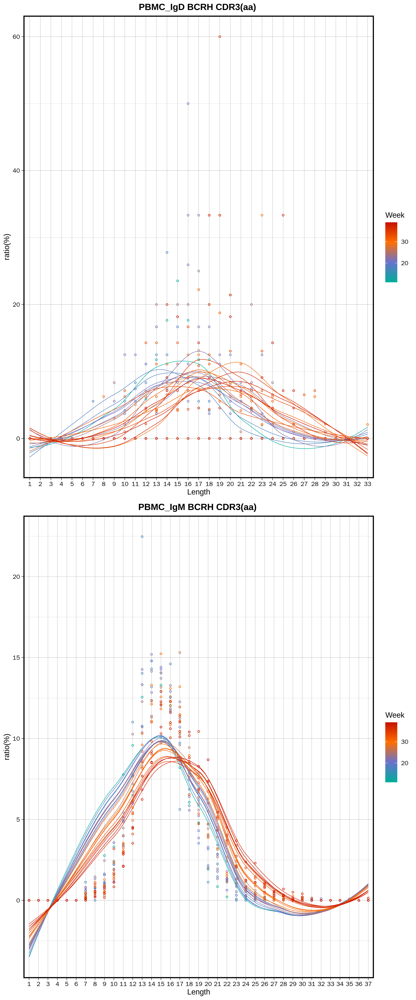

In [68]:
%%R -w 2500 -h 6000 -r 300 
library(RColorBrewer )
paths='/data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/BCR_Figure/BCRISOdata/'
BCRHplot_list=list()
# for (i in c('PBMC_IgA_ratio.csv',  'PBMC_IgG_ratio.csv', 
# 'PBMC_IgD_ratio.csv',  'PBMC_IgL_ratio.csv',  'PBMC_IgM_ratio.csv')){
for (i in c(
'PBMC_IgD_ratio.csv',  'PBMC_IgM_ratio.csv')){
  print(i)
  name=gsub('_ratio.csv','',i)
  BCRHdata=read.csv(paste0(paths,i))
  BCRHdata<-BCRHdata[rowSums(BCRHdata)>0,]
  
  # 将每个绘制的图像存储在plot_list中
  BCRHplot_list[[i]] <- plot_PBMC_sum_ratio_celltype(BCRHdata, plot_title =paste0(name,' BCRH CDR3(aa) '))+
    scale_color_gradientn(colours = rev(colorRampPalette(c("#C71000B2","#FF6F00B2","#6a73cf","#00AF99" ))(100)))
}
P12=grid.arrange(grobs = BCRHplot_list, ncol = 1)  
ggsave(plot=P12,"/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Sup_Figure5/S5new/IGHsmooth.pdf",height=8,width=8)

In [69]:
mkdir -p /home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Sup_Figure5/S5new

[1] "PBMC_IgD_ratio.csv"
[1] "PBMC_IgM_ratio.csv"
Saving 8.33 x 10 in image


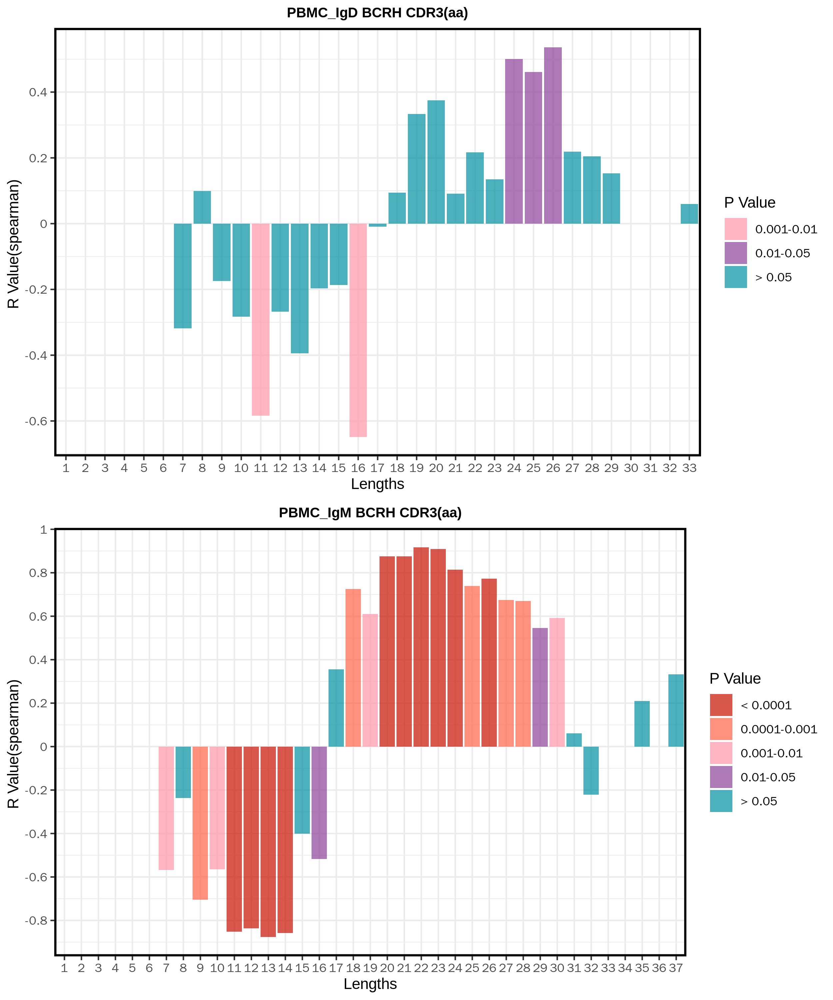

In [70]:
%%R -w 2500 -h 3000 -r 300 
# dir('/data5/maolp/Gaofeng_All_matrix/Allcount/Last_All_scanpyData/BCR_Figure/BCRdata/IGH/')
library(tidyverse)
library(reshape2)
library(gridExtra)
BCRHplot_pvalue <- list()
paths='/data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/BCR_Figure/BCRISOdata/'

Adatalist=c('PBMC_IgD_ratio.csv', 'PBMC_IgM_ratio.csv')
plot_list=list()
for (i in Adatalist){
  print(i)
  name=gsub('_ratio.csv','',i)
  BCRdata=read.csv(paste0(paths,i))
  BCRdata<-BCRdata[rowSums(BCRdata)>0,]
#   print(head(plot_Cell_sum_ratio_celltype(BCRdata)))
  
  BCRHtem <- plot_Cell_sum_ratio_celltype(BCRdata)
#   print(Dfcalculate_correlation(BCRHtem , "lengths", "week", "proportion"))
  BCRHtem2 <- Dfcalculate_correlation(BCRHtem , "lengths", "week", "proportion")

  BCRHtem3 <- create_pval_plot(BCRHtem2,paste0(name,' IGH'))  
#   print(BCRHtem3)
 BCRHplot_pvalue[[i]] <- create_pval_plot(BCRHtem2,paste0(name,' BCRH CDR3(aa)'))  
}

P11=grid.arrange(grobs =BCRHplot_pvalue, ncol = 1)  
P11
ggsave(plot=P11,"/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Sup_Figure5/S5new/IGHpvalue.pdf")